# DEMENTIA SEQ LBD
# Gene Burden/Rare variant analysis: chrX

**Start date:** 2020-06-08

**End date:** 2020-06-08

**Updated date:** 2023-12-28

**Author(s):** Ruth Chia

**Working directory on biowulf:** `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023`

**NOTE ABOUT THIS RUN:** Included minmac 3 filter in the analysis; used genetic PCs derived from autosomal and X chromosomes for covariate adjustment

In [1]:
!pwd

/vf/users/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023


## Files needed
1. QC-ed plink2 binaries: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/merged.clean/FINAL.QC.males.females.noPAR.chrX.bed/bim/fam`

## What I need to do
0. Create plink files with `--mac 3` filter for annotation
1. Annotate the files using Mary's script
2. Run RVTEST for gene burden

## Create `CLEAN` plink2 files for annotation

In [3]:
%%bash
mkdir CLEAN.forBurdenAnalysis

DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

# make list of samples to keep
## both
awk 'NR==1;NR>1 {if($3 != "NA") print}' $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.exclGENDER.forXWAS.txt | awk '{print $1,$2}' > SampleList.LBD.controls.inAnalysis.txt

module load plink/3.6-alpha

plink2 \
--bfile $DATA/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep SampleList.LBD.controls.inAnalysis.txt \
--mac 3 \
--allow-no-sex \
--threads 32 \
--make-pgen \
--out CLEAN.forBurdenAnalysis/FINAL.QC.males.females.noPAR.mac3.chrX

plink2 \
--pfile CLEAN.forBurdenAnalysis/FINAL.QC.males.females.noPAR.mac3.chrX \
--keep-males \
--mac 3 \
--allow-no-sex \
--threads 32 \
--make-pgen \
--out CLEAN.forBurdenAnalysis/FINAL.QC.males.noPAR.mac3.chrX

plink2 \
--pfile CLEAN.forBurdenAnalysis/FINAL.QC.males.females.noPAR.mac3.chrX \
--keep-females \
--mac 3 \
--allow-no-sex \
--threads 32 \
--make-pgen \
--out CLEAN.forBurdenAnalysis/FINAL.QC.females.noPAR.mac3.chrX

[-] Unloading plink  3.6-alpha 
[+] Loading plink  3.6-alpha 


PLINK v2.00a3.6LM 64-bit Intel (14 Aug 2022)   www.cog-genomics.org/plink/2.0/
(C) 2005-2022 Shaun Purcell, Christopher Chang   GNU General Public License v3
Logging to CLEAN.forBurdenAnalysis/FINAL.QC.males.females.noPAR.mac3.chrX.log.
Options in effect:
  --allow-no-sex
  --bfile /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/merged.clean/FINAL.QC.males.females.noPAR.chrX
  --keep SampleList.LBD.controls.inAnalysis.txt
  --mac 3
  --make-pgen
  --out CLEAN.forBurdenAnalysis/FINAL.QC.males.females.noPAR.mac3.chrX
  --threads 32

Start time: Thu Dec 28 12:36:34 2023
Note: --allow-no-sex no longer has any effect.  (Missing-sex samples are
automatically excluded from association analysis when sex is a covariate, and
treated normally otherwise.)
257541 MiB RAM detected; reserving 128770 MiB for main workspace.
Using up to 32 threads (change this with --threads).
6632 samples (3010 females, 3622 males; 6632 founders) loaded from
/data/ALS_50k/DementiaSeq.TopmedJoint

## Annotate variants

Script to annotate: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/scripts/annovar_per_chr.sh`

Note: updated protocol database for use for annotation, also updated splice bp to 200bp from intron/exon boundaries (previously was set to 15bp).

```bash
#!/bin/bash

# sbatch --cpus-per-task=20 --mem=240g --mail-type=END --time=72:00:00 annovar_per_chr.sh CHROMOSOME
CHNUM=$1

# Initializing some variables
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

# Loading the necessary modules 
module load plink/3.6-alpha
module load annovar/2020-06-08
module load vcftools/0.1.16

# QC Files 
cd $WORKING_DIR
mkdir $WORKING_DIR/short_VCFs
plink2 --pfile $WORKING_DIR/CLEAN.forBurdenAnalysis/FINAL.QC.males.females.noPAR.mac3.chr${CHNUM} --export vcf id-paste=iid --out $WORKING_DIR/short_VCFs/VCF_FILE.${CHNUM}

# Cut the columns and keep only the necessary ones for annotation 
cd $WORKING_DIR/short_VCFs
    cut -f 1-10 $WORKING_DIR/short_VCFs/VCF_FILE.${CHNUM}.vcf > $WORKING_DIR/short_VCFs/short_VCF_FILE.${CHNUM}.tidy.vcf

# Run ANNOVAR 
table_annovar.pl $WORKING_DIR/short_VCFs/short_VCF_FILE.${CHNUM}.tidy.vcf $ANNOVAR_DATA/hg38 --thread 20 -buildver hg38 -out $WORKING_DIR/short_VCFs/annotation.tidy.${CHNUM} -arg '-splicing 200',,,,,,, -remove -protocol refGene,dbnsfp42a,gnomad312_genome,clinvar_20221231,regsnpintron,spidex,revel,mcap \
-operation g,f,f,f,f,f,f,f -nastring . -vcfinput -polish

# Remove any of the VCFs (won't be neeeded and take too much space)
rm $WORKING_DIR/short_VCFs/VCF_FILE.${CHNUM}.log
rm $WORKING_DIR/short_VCFs/annotation.tidy.${CHNUM}.hg38_multianno.vcf
rm $WORKING_DIR/short_VCFs/short_VCF_FILE.${CHNUM}.tidy.vcf
rm $WORKING_DIR/short_VCFs/annotation.tidy.${CHNUM}.avinput

# Run annotation via sbatch 
#for CHNUM in {1..22} X Y;
#do
#	sbatch --cpus-per-task=20 --mem=240g --time=72:00:00 annovar_per_chr.sh ${CHNUM}
#done
```

In [4]:
%%bash
chmod u+x ./scripts/annovar_per_chr.sh

./scripts/annovar_per_chr.sh X


[-] Unloading plink  3.6-alpha 
[+] Loading plink  3.6-alpha 
[-] Unloading annovar 2020-06-08 on cn3180 
[+] Loading annovar 2020-06-08 on cn3180 
[+] Loading samtools 1.17  ... 
[+] Loading vcftools  0.1.16 


PLINK v2.00a3.6LM 64-bit Intel (14 Aug 2022)   www.cog-genomics.org/plink/2.0/
(C) 2005-2022 Shaun Purcell, Christopher Chang   GNU General Public License v3
Logging to /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/short_VCFs/VCF_FILE.X.log.
Options in effect:
  --export vcf id-paste=iid
  --out /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/short_VCFs/VCF_FILE.X
  --pfile /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/CLEAN.forBurdenAnalysis/FINAL.QC.males.females.noPAR.mac3.chrX

Start time: Thu Dec 28 12:38:09 2023
257541 MiB RAM detected; reserving 128770 MiB for main workspace.
Using up to 56 threads (change this with --threads).
6614 samples (3008 females, 3606 males; 6614 founders) loaded from
/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/CLEAN.forBurdenAnalysis/FINAL.QC.males.fem


NOTICE: Running with system command <convert2annovar.pl  -includeinfo -allsample -withfreq -format vcf4 /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/short_VCFs/short_VCF_FILE.X.tidy.vcf > /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/short_VCFs/annotation.tidy.X.avinput>
NOTICE: Finished reading 678794 lines from VCF file
NOTICE: A total of 678787 locus in VCF file passed QC threshold, representing 635843 SNPs (441178 transitions and 194665 transversions) and 42944 indels/substitutions
NOTICE: Finished writing allele frequencies based on 635843 SNP genotypes (441178 transitions and 194665 transversions) and 42944 indels/substitutions for 1 samples

NOTICE: Running with system command </usr/local/apps/annovar/2020-06-08/table_annovar.pl /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/short_VCFs/annotation.tidy.X.avinput /fdb/annovar/cur

## Prep variants to different subgroup for downstream analysis

The different subgroups are 
- Missense
- Stopgain and stoploss 
- Frameshift deletion and insertion 
- Splicing 
- CADD12 (that are not synonymous)

note about the four additional database that was added to the script:
`https://annovar.openbioinformatics.org/en/latest/user-guide/download/#user-contributed-datasets`
1. `regsnpintron` - uses a machine learning algorithm to prioritize the disease-causing probability of intronic SNVs. The columns are "fpr (False positive rate), disease Disease category (B: benign [FPR > 0.1]; PD: Possibly Damaging [0.05 < FPR <= 0.1]; D: Damaging [FPR <= 0.05]), splicing_site Splicing site (on/off). Splicing sites are defined as -3 to +7 for donor sites, -13 to +1 for acceptor sites.". 



2. `spidex`: `SPIDEX` (Xiong et al, Science 2015) Machine-learning prediction on how genetic variants affect RNA splicing (https://www.science.org/doi/10.1126/science.1254806). Relevant references of paper/s using this algorithm: `https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5552324/#pone.0182946.ref022`, 



3. `revel`: REVEL (i.e. rare exome variant ensemble learner) scores for non-synonymous variants - an ensemble method for predicting the pathogenicity of missense variants on the basis of individual tools: MutPred, FATHMM, VEST, PolyPhen, SIFT, PROVEAN, MutationAssessor, MutationTaster, LRT, GERP, SiPhy, phyloP, and phastCons. From results from the website, it looks like the threshold for REVEL score > 0.5 would be middle ground for reasonable sensitivity and specifity. Revel score > 0.75 will give higher specificty but lower sensitivity. Link to paper: http://dx.doi.org/10.1016/j.ajhg.2016.08.016; link to website: https://sites.google.com/site/revelgenomics/about



4. `mcap` - M-CAP scores for non-synonymous/rare missense variants. Mendelian Clinically Applicable Pathogenicity (M-CAP) Score is a pathogenicity classifier for rare missense variants in the human genome that is tuned to the high sensitivity required in the clinic. It uses nine established pathogenicity likelihood scores: SIFT13, PolyPhen-2, CADD, MutationTaster, MutationAssessor, FATHMM, LRT, MetaLR, and MetaSVM. It also incorporates seven established measures of base-pair, amino acid, genomic region, and gene conservation: RVIS, PhyloP, PhastCons, PAM250, BLOSUM62, SIPHY28, and GERP29. In addition, M-CAP introduces 298 new features derived from multiple-sequence alignment of 99 primate, mammalian, and vertebrate genomes to the human genome. Three vectors of 99 binary features indicate whether each species has the human reference amino acid, the alternative amino acid, or no amino acid aligning. One integer feature counts the number of different amino acids observed at the codon across the 100 species. The new features are ideal for machine learning; they delegate the task of deriving a sophisticated measure of evolutionary constraint to the learning model. Article link: https://www.nature.com/articles/ng.3703; website link: http://bejerano.stanford.edu/mcap/index.html


___

Example excerpt from paper annotating and filtering non-coding variants: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5552324/#pone.0182946.ref022
> **Assessment of deep intronic variants**

>The noncoding variants were prioritized using GWAVA [44], CADD [45], SPIDEX [22], and Genomiser [46]. The genome-wide annotation of variants (GWAVA) is a computational approach that integrates a wide range of available genomic and epigenomic annotations to predict the functional impact of variants. GWAVA results are in the range 0–1, with higher values indicating variants predicted as more likely to be functional. Variants with a GWAVA score above 0.5 were classified as functional, as in previous studies [44]. The Combined Annotation-Dependent Depletion (CADD) method provides a metric (C score) for deleteriousness, a property that strongly correlates with functionality and pathogenicity [45]. Variants at the top 10% of deleteriousness are assigned a C score of 10, whereas variants at the top 1% are assigned a C score of 20. Variants with C score greater than 15 were selected, as previously described [54]. SPIDEX is a computational model that uses the Percentage of Spliced-In (PSI) metric to evaluate whether a certain splicing isoform is more enriched under the presence/absence of a given variant. SPIDEX scores higher than 5 predict that the variant affects RNA splicing [22]. The Genomiser framework combines a machine learning method and an integrative algorithm for ranking noncoding variants in whole-genome sequence data [46]. Genomiser results are in the range 0–1, with values higher than 0.6–0.9 indicating variants more likely to be pathogenic [46].

In [5]:
!head -n 1 short_VCFs/annotation.tidy.X.hg38_multianno.txt | tr '\t' '\n' | cat -n

     1	Chr
     2	Start
     3	End
     4	Ref
     5	Alt
     6	Func.refGene
     7	Gene.refGene
     8	GeneDetail.refGene
     9	ExonicFunc.refGene
    10	AAChange.refGene
    11	SIFT_score
    12	SIFT_converted_rankscore
    13	SIFT_pred
    14	SIFT4G_score
    15	SIFT4G_converted_rankscore
    16	SIFT4G_pred
    17	Polyphen2_HDIV_score
    18	Polyphen2_HDIV_rankscore
    19	Polyphen2_HDIV_pred
    20	Polyphen2_HVAR_score
    21	Polyphen2_HVAR_rankscore
    22	Polyphen2_HVAR_pred
    23	LRT_score
    24	LRT_converted_rankscore
    25	LRT_pred
    26	MutationTaster_score
    27	MutationTaster_converted_rankscore
    28	MutationTaster_pred
    29	MutationAssessor_score
    30	MutationAssessor_rankscore
    31	MutationAssessor_pred
    32	FATHMM_score
    33	FATHMM_converted_rankscore
    34	FATHMM_pred
    35	PROVEAN_score
    36	PROVEAN_converted_rankscore
    37	PROVEAN_pred
    38	VEST4_score
    39	VEST4_rankscore
    40	MetaSVM_score
    41	MetaSVM_rankscore
    42	MetaSVM_pred
  

In [6]:
%%bash

for CHNUM in X;
do
cut -f1-145,151 short_VCFs/annotation.tidy.${CHNUM}.hg38_multianno.txt > short_VCFs/annotation.tidy.${CHNUM}.hg38_multianno_TIDY.txt
done


In [ ]:
# Make list of variants for functional group testing
# missense
# missense_mcap_revel_spidex_regsnp

# lof
# lof_mcap_revel_spidex_regsnp

# cadd12
# cadd12_mcap_revel_spidex_regsnp

# intronic_mcap_revel_spidex_regsnp

# missense + lof
# missense_mcap_revel_spidex_regsnp + lof_mcap_revel_spidex_regsnp

# missense + lof + cadd12
# missense_mcap_revel_spidex_regsnp + lof_mcap_revel_spidex_regsnp + cadd12_mcap_revel_spidex_regsnp

# missense + lof + cadd12 + intronic
# missense_mcap_revel_spidex_regsnp + lof_mcap_revel_spidex_regsnp + cadd12_mcap_revel_spidex_regsnp + intronic_mcap_revel_spidex_regsnp

# mcap_revel
# spidex_regsnp
# mcap_revel_spidex_regsnp

In [8]:
import pandas as pd
import numpy as np

anno = pd.read_csv("short_VCFs/annotation.tidy.X.hg38_multianno_TIDY.txt",sep="\t")
colsToKeep = ['Chr', 'Start', 'End', 'Ref', 'Alt', 'Func.refGene', 'Gene.refGene',
              'GeneDetail.refGene', 'ExonicFunc.refGene', 'AAChange.refGene',
              'M-CAP_score','M-CAP_rankscore','M-CAP_pred','REVEL_score','REVEL_rankscore',
              'PrimateAI_score','PrimateAI_rankscore','PrimateAI_pred',
              'Aloft_pred','Aloft_Confidence','CADD_raw','CADD_raw_rankscore','CADD_phred',
              'GTEx_V8_gene','GTEx_V8_tissue',
              'regsnp_fpr','regsnp_disease','regsnp_splicing_site',
              'dpsi_max_tissue','dpsi_zscore','Otherinfo6']
anno_tidy = anno[colsToKeep].rename(columns={'Otherinfo6':'SNP'})
anno_tidy = anno_tidy.replace(".","NA")
anno_tidy.to_csv("short_VCFs/annotation.tidy.X.hg38_multianno_TIDY_CLEAN.txt",sep="\t",index=False,header=True)
print(anno_tidy.shape)
    
pd.crosstab(index=anno_tidy['Func.refGene'],columns=anno_tidy['ExonicFunc.refGene'],margins=True)


(678787, 31)


ExonicFunc.refGene,NA,frameshift deletion,frameshift insertion,nonframeshift deletion,nonframeshift insertion,nonsynonymous SNV,startloss,stopgain,stoploss,synonymous SNV,unknown,All
Func.refGene,,,,,,,,,,,,
UTR3,5026,0,0,0,0,0,0,0,0,0,0,5026
UTR5,1012,0,0,0,0,0,0,0,0,0,0,1012
UTR5;UTR3,1,0,0,0,0,0,0,0,0,0,0,1
downstream,3470,0,0,0,0,0,0,0,0,0,0,3470
exonic,0,14,1,34,6,1873,7,25,3,1783,7,3753
exonic;splicing,0,1,0,1,0,124,0,1,0,115,0,242
intergenic,455666,0,0,0,0,0,0,0,0,0,0,455666
intronic,168809,0,0,0,0,0,0,0,0,0,0,168809
ncRNA_exonic,1224,0,0,0,0,0,0,0,0,0,0,1224


In [9]:
import pandas as pd
import numpy as np

input = "./short_VCFs/annotation.tidy.X.hg38_multianno_TIDY_CLEAN.txt"
anno_tidy = pd.read_csv(input,sep="\t")
anno_tidy = anno_tidy.fillna("NA")

# make list of variant that are missense + nonsynonymous
missense = anno_tidy[(anno_tidy['Func.refGene'].str.contains("exonic")) & 
                     (anno_tidy['ExonicFunc.refGene'].str.contains("nonsynonymous"))]

# make list of variant that are stop
stop = anno_tidy[(anno_tidy['Func.refGene'].str.contains("exonic")) & 
             (anno_tidy['ExonicFunc.refGene'].str.contains("stop"))]

# make list of variant that are frame
frame = anno_tidy[(anno_tidy['ExonicFunc.refGene'].str.contains("frameshift")) & 
                 ~(anno_tidy['ExonicFunc.refGene'].str.contains("nonframe"))]

# make list of variant that are splicing
splicing = anno_tidy[(anno_tidy['Func.refGene'].str.contains("splicing"))]

# make list of variant that are frame
frame = anno_tidy[(anno_tidy['ExonicFunc.refGene'].str.contains("frameshift")) & 
                 ~(anno_tidy['ExonicFunc.refGene'].str.contains("nonframe"))]

# make list of variant that are collective LOF in predictive functional effect
lof = pd.concat([stop,frame,splicing],axis=0).drop_duplicates()

# make list of variant that have CADD_phred > 12
temp = anno_tidy[~(anno_tidy['ExonicFunc.refGene'] == "synonymous SNV") & 
                 ~(anno_tidy['CADD_phred'] == "NA")]
cadd12 = temp[ (temp['CADD_phred'].astype(float) > 12) ]

# make list of variant with regsnp score < 0.1
temp = anno_tidy[~(anno_tidy['regsnp_fpr'] == "NA")]
regsnp = temp[ (temp['regsnp_fpr'].astype(float) < 0.1)]

# make list of variant with spidex score > 5
temp = anno_tidy[~(anno_tidy['dpsi_max_tissue'] == "NA")]
spidex = temp[ (temp['dpsi_max_tissue'].astype(float) > 5) ]

# make list of variant with mcap score > 0.025
temp = anno_tidy[~(anno_tidy['M-CAP_score'] == "NA")]
mcap = temp[ (temp['M-CAP_score'].astype(float) > 0.025) ]

# make list of variant with revel score > 0.5
temp = anno_tidy[~(anno_tidy['REVEL_score'] == "NA")]
revel = temp[ (temp['REVEL_score'].astype(float) > 0.5) ]

# make list of intronic variants
intronic = anno_tidy[(anno_tidy['Func.refGene'] == "intronic")]

# make up new list of variants with more stringent filters: consensus (missense + mcap > 0.025)
missense_mcap = missense[(missense.SNP.isin(mcap.SNP))]

# make up new list of variants with more stringent filters: consensus (missense + revel > 0.5)
missense_revel = missense[(missense.SNP.isin(revel.SNP))]

# make up new list of variants with more stringent filters: consensus (missense + spidex > 5)
missense_spidex = missense[(missense.SNP.isin(spidex.SNP))]

# make up new list of variants with more stringent filters: consensus (missense + regsnp < 0.1)
missense_regsnp = missense[(missense.SNP.isin(regsnp.SNP))]

# make up new list of variants with more stringent filters: 
# consensus (missense + mcap < 0.025) | consensus (missense + revel > 0.5)
missense_mcap_revel = pd.concat([missense_mcap,missense_revel],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: 
# consensus (missense + spidex > 5) | consensus (missense + regsnp < 0.1)
missense_spidex_regsnp = pd.concat([missense_spidex,missense_regsnp],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: 
# consensus (missense + spidex > 5) | consensus (missense + regsnp < 0.1) | consensus (missense + mcap < 0.025) | consensus (missense + revel > 0.5)
missense_mcap_revel_spidex_regsnp = pd.concat([missense_mcap_revel,missense_spidex_regsnp],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: consensus (lof + mcap > 0.025)
lof_mcap = lof[(lof.SNP.isin(mcap.SNP))]

# make up new list of variants with more stringent filters: consensus (lof + revel > 0.5)
lof_revel = lof[(lof.SNP.isin(revel.SNP))]

# make up new list of variants with more stringent filters: consensus (lof + spidex > 5)
lof_spidex = lof[(lof.SNP.isin(spidex.SNP))]

# make up new list of variants with more stringent filters: consensus (lof + regsnp < 0.1)
lof_regsnp = lof[(lof.SNP.isin(regsnp.SNP))]

# make up new list of variants with more stringent filters: 
# consensus (lof + mcap < 0.025) | consensus (lof + revel > 0.5)
lof_mcap_revel = pd.concat([lof_mcap,lof_revel],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: 
# consensus (lof + spidex > 5) | consensus (lof + regsnp < 0.1)
lof_spidex_regsnp = pd.concat([lof_spidex,lof_regsnp],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: 
# consensus (lof + spidex > 5) | consensus (lof + regsnp < 0.1) | consensus (lof + mcap < 0.025) | consensus (lof + revel > 0.5)
lof_mcap_revel_spidex_regsnp = pd.concat([lof_mcap_revel,lof_spidex_regsnp],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: mcap > 0.025 | revel > 0.5
mcap_revel = pd.concat([mcap,revel],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: spidex > 5 | regsnp < 0.1
spidex_regsnp = pd.concat([spidex,regsnp],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: spidex > 5 | regsnp < 0.1 | mcap > 0.025 | revel > 0.5
mcap_revel_spidex_regsnp = pd.concat([spidex,regsnp,mcap,revel],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: consensus (cadd12 + mcap > 0.025)
cadd12_mcap = cadd12[(cadd12.SNP.isin(mcap.SNP))]

# make up new list of variants with more stringent filters: consensus (cadd12 + revel > 0.5)
cadd12_revel = cadd12[(cadd12.SNP.isin(revel.SNP))]

# make up new list of variants with more stringent filters: consensus (cadd12 + spidex > 5)
cadd12_spidex = cadd12[(cadd12.SNP.isin(spidex.SNP))]

# make up new list of variants with more stringent filters: consensus (cadd12 + regsnp < 0.1)
cadd12_regsnp = cadd12[(cadd12.SNP.isin(regsnp.SNP))]

# make up new list of variants with more stringent filters: 
# consensus (cadd12 + mcap < 0.025) | consensus (cadd12 + revel > 0.5)
cadd12_mcap_revel = pd.concat([cadd12_mcap,cadd12_revel],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: 
# consensus (cadd12 + spidex > 5) | consensus (cadd12 + regsnp < 0.1)
cadd12_spidex_regsnp = pd.concat([cadd12_spidex,cadd12_regsnp],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: 
# consensus (cadd12 + spidex > 5) | consensus (cadd12 + regsnp < 0.1) | consensus (cadd12 + mcap < 0.025) | consensus (cadd12 + revel > 0.5)
cadd12_mcap_revel_spidex_regsnp = pd.concat([cadd12_mcap_revel,cadd12_spidex_regsnp],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: consensus (intronic + mcap > 0.025)
intronic_mcap = intronic[(intronic.SNP.isin(mcap.SNP))]

# make up new list of variants with more stringent filters: consensus (intronic + revel > 0.5)
intronic_revel = intronic[(intronic.SNP.isin(revel.SNP))]

# make up new list of variants with more stringent filters: consensus (intronic + spidex > 5)
intronic_spidex = intronic[(intronic.SNP.isin(spidex.SNP))]

# make up new list of variants with more stringent filters: consensus (intronic + regsnp < 0.1)
intronic_regsnp = intronic[(intronic.SNP.isin(regsnp.SNP))]

# make up new list of variants with more stringent filters: 
# consensus (intronic + mcap < 0.025) | consensus (intronic + revel > 0.5)
intronic_mcap_revel = pd.concat([intronic_mcap,intronic_revel],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: 
# consensus (intronic + spidex > 5) | consensus (intronic + regsnp < 0.1)
intronic_spidex_regsnp = pd.concat([intronic_spidex,intronic_regsnp],axis=0).drop_duplicates()

# make up new list of variants with more stringent filters: 
# consensus (intronic + spidex > 5) | consensus (intronic + regsnp < 0.1) | consensus (intronic + mcap < 0.025) | consensus (intronic + revel > 0.5)
intronic_mcap_revel_spidex_regsnp = pd.concat([intronic_mcap_revel,intronic_spidex_regsnp],axis=0).drop_duplicates()

# make variants list to save
vars_missense = missense.sort_values(by=['Chr','Start'])[['SNP']]
vars_missense_mcap_revel_spidex_regsnp = missense_mcap_revel_spidex_regsnp.sort_values(by=['Chr','Start'])[['SNP']]

vars_lof = lof.sort_values(by=['Chr','Start'])[['SNP']]
vars_lof_mcap_revel_spidex_regsnp = lof_mcap_revel_spidex_regsnp.sort_values(by=['Chr','Start'])[['SNP']]

vars_cadd12 = cadd12.sort_values(by=['Chr','Start'])[['SNP']]
vars_cadd12_mcap_revel_spidex_regsnp = cadd12_mcap_revel_spidex_regsnp.sort_values(by=['Chr','Start'])[['SNP']]

vars_intronic_mcap_revel_spidex_regsnp = intronic_mcap_revel_spidex_regsnp.sort_values(by=['Chr','Start'])[['SNP']]

vars_miss_lof = pd.concat([missense,lof],axis=0).drop_duplicates().sort_values(by=['Chr','Start'])[['SNP']]
vars_miss_lof_mcap_revel_spidex_regsnp = pd.concat([missense_mcap_revel_spidex_regsnp,lof_mcap_revel_spidex_regsnp],axis=0).drop_duplicates().sort_values(by=['Chr','Start'])[['SNP']]

vars_miss_lof_cadd12 = pd.concat([missense,lof,cadd12],axis=0).drop_duplicates().sort_values(by=['Chr','Start'])[['SNP']]
vars_miss_lof_cadd12_mcap_revel_spidex_regsnp = pd.concat([missense_mcap_revel_spidex_regsnp,lof_mcap_revel_spidex_regsnp,cadd12_mcap_revel_spidex_regsnp],axis=0).drop_duplicates().sort_values(by=['Chr','Start'])[['SNP']]

vars_miss_lof_cadd12_intronic = pd.concat([missense,lof,cadd12,intronic_mcap_revel_spidex_regsnp],axis=0).drop_duplicates().sort_values(by=['Chr','Start'])[['SNP']]
vars_miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp = pd.concat([missense_mcap_revel_spidex_regsnp,lof_mcap_revel_spidex_regsnp,cadd12_mcap_revel_spidex_regsnp,intronic_mcap_revel_spidex_regsnp],axis=0).drop_duplicates().sort_values(by=['Chr','Start'])[['SNP']]

vars_mcap_revel = mcap_revel.sort_values(by=['Chr','Start'])[['SNP']]
vars_spidex_regsnp = spidex_regsnp.sort_values(by=['Chr','Start'])[['SNP']]
vars_mcap_revel_spidex_regsnp = mcap_revel_spidex_regsnp.sort_values(by=['Chr','Start'])[['SNP']]

# save variant list
vars_missense.to_csv("./short_VCFs/missense_variant_names.txt",sep="\t",index=False,header=False)
vars_missense_mcap_revel_spidex_regsnp.to_csv("./short_VCFs/missense_mcap_revel_spidex_regsnp_variant_names.txt",sep="\t",index=False,header=False)

vars_lof.to_csv("./short_VCFs/lof_variant_names.txt",sep="\t",index=False,header=False)
vars_lof_mcap_revel_spidex_regsnp.to_csv("./short_VCFs/lof_mcap_revel_spidex_regsnp_variant_names.txt",sep="\t",index=False,header=False)

vars_cadd12.to_csv("./short_VCFs/cadd12_variant_names.txt",sep="\t",index=False,header=False)
vars_cadd12_mcap_revel_spidex_regsnp.to_csv("./short_VCFs/cadd12_mcap_revel_spidex_regsnp_variant_names.txt",sep="\t",index=False,header=False)

vars_intronic_mcap_revel_spidex_regsnp.to_csv("./short_VCFs/intronic_mcap_revel_spidex_regsnp_variant_names.txt",sep="\t",index=False,header=False)

vars_miss_lof.to_csv("./short_VCFs/miss_lof_variant_names.txt",sep="\t",index=False,header=False)
vars_miss_lof_mcap_revel_spidex_regsnp.to_csv("./short_VCFs/miss_lof_mcap_revel_spidex_regsnp_variant_names.txt",sep="\t",index=False,header=False)

vars_miss_lof_cadd12.to_csv("./short_VCFs/miss_lof_cadd12_variant_names.txt",sep="\t",index=False,header=False)
vars_miss_lof_cadd12_mcap_revel_spidex_regsnp.to_csv("./short_VCFs/miss_lof_cadd12_mcap_revel_spidex_regsnp_variant_names.txt",sep="\t",index=False,header=False)

vars_miss_lof_cadd12_intronic.to_csv("./short_VCFs/miss_lof_cadd12_intronic_variant_names.txt",sep="\t",index=False,header=False)
vars_miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.to_csv("./short_VCFs/miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp_variant_names.txt",sep="\t",index=False,header=False)

vars_mcap_revel.to_csv("./short_VCFs/mcap_revel_variant_names.txt",sep="\t",index=False,header=False)
vars_spidex_regsnp.to_csv("./short_VCFs/spidex_regsnp_variant_names.txt",sep="\t",index=False,header=False)
vars_mcap_revel_spidex_regsnp.to_csv("./short_VCFs/mcap_revel_spidex_regsnp_variant_names.txt",sep="\t",index=False,header=False)


In [14]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

wc -l short_VCFs/*_variant_names.txt


    580 short_VCFs/cadd12_mcap_revel_spidex_regsnp_variant_names.txt
   1196 short_VCFs/cadd12_variant_names.txt
    298 short_VCFs/intronic_mcap_revel_spidex_regsnp_variant_names.txt
    767 short_VCFs/lof_mcap_revel_spidex_regsnp_variant_names.txt
  10672 short_VCFs/lof_variant_names.txt
   1703 short_VCFs/mcap_revel_spidex_regsnp_variant_names.txt
    674 short_VCFs/mcap_revel_variant_names.txt
   1682 short_VCFs/miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp_variant_names.txt
  12858 short_VCFs/miss_lof_cadd12_intronic_variant_names.txt
   1386 short_VCFs/miss_lof_cadd12_mcap_revel_spidex_regsnp_variant_names.txt
  12562 short_VCFs/miss_lof_cadd12_variant_names.txt
   1378 short_VCFs/miss_lof_mcap_revel_spidex_regsnp_variant_names.txt
  12545 short_VCFs/miss_lof_variant_names.txt
    658 short_VCFs/missense_mcap_revel_spidex_regsnp_variant_names.txt
   1997 short_VCFs/missense_variant_names.txt
   1029 short_VCFs/spidex_regsnp_variant_names.txt
  61985 total


In [15]:
%%bash
cd short_VCFs/
ls -ltrh *_variant_names.txt | awk '{print $9}' | awk '{gsub("_variant_names.txt","",$1); print}'


missense
missense_mcap_revel_spidex_regsnp
lof
lof_mcap_revel_spidex_regsnp
cadd12
cadd12_mcap_revel_spidex_regsnp
intronic_mcap_revel_spidex_regsnp
miss_lof
miss_lof_mcap_revel_spidex_regsnp
miss_lof_cadd12
miss_lof_cadd12_mcap_revel_spidex_regsnp
miss_lof_cadd12_intronic
miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp
mcap_revel
spidex_regsnp
mcap_revel_spidex_regsnp


noticed that for genes which overlap (i.e. some positions in forward and reverse strand), when running RVTESTS, the tool mistakenly groups variants solely by position and does not take strand-ness into account. For example, for TEX13A and IL1RAPL2, there is actually only one missense variant for IL1RAPL2, and four for TEX13A. But due to the fact that part of IL1RAPL2 overlaps with TEX13A, it agrgegates the other four variants that were part of TEX13A into IL1RAPL2 when running the gene level tests. This is a problem. 

So, will re-filter the variant list for each fucntional groupings and only keep genes when there is more than one variant per gene. 

In [16]:
%%bash
cd short_VCFs/

module load R/4.3
R --vanilla --no-save

require(data.table)
require(tidyverse)


# make list of func_group
groupings <- c("missense","missense_mcap_revel_spidex_regsnp","lof","lof_mcap_revel_spidex_regsnp","cadd12","cadd12_mcap_revel_spidex_regsnp","intronic_mcap_revel_spidex_regsnp","miss_lof","miss_lof_mcap_revel_spidex_regsnp","miss_lof_cadd12","miss_lof_cadd12_mcap_revel_spidex_regsnp","miss_lof_cadd12_intronic","miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp","mcap_revel","spidex_regsnp","mcap_revel_spidex_regsnp")


# create function to update functional grouping for variants such that number vars per gene > 1
update_functional_groupings <- function(i){
    # assign func_group name
    func_name <- groupings[i]

    # read in annotation file
    annot <- fread("annotation.tidy.X.hg38_multianno_TIDY_CLEAN.txt",header=T)

    # read in functional grouping file containing list of variants
    vars <- fread(paste(func_name,"_variant_names.txt",sep=""),header=F)
    colnames(vars) <- "SNP"

    # filter annotation file to keep variants that are present in the fucntional grouping file
    annot_filter <- subset(annot, annot$SNP %in% vars$SNP)

    # tabulate number of variants per gene; then filter to keep only genes where there are more than 1 variant
    vars_per_gene <- annot_filter %>% group_by(Gene.refGene) %>% count() %>% filter(n>1)

    # refilter the `annot_filter` dataframe to contain only variants from genes where number of variants > 1
    annot_filter_clean <- subset(annot_filter, annot_filter$Gene.refGene %in% vars_per_gene$Gene.refGene)
    
    # make updated list of genes per fucntional group to keep for plotting downstream
    genes_to_keep <- annot_filter_clean %>% select(Gene.refGene) %>% distinct() %>% arrange(Gene.refGene)
    write.table(genes_to_keep, paste(func_name,"_gene_names_updated.txt",sep=""),quote=F, sep="\t", row.names=F, col.names=F)
    
    # make updated list of functional grouping; then save out the updated variant list per functional group
    vars_updated <- annot_filter_clean %>% select(SNP)
    write.table(vars_updated, paste(func_name,"_variant_names_updated.txt",sep=""),quote=F, sep="\t", row.names=F, col.names=F)

    # sanity check: check number of rows
    dim(annot)
    dim(annot_filter)
    dim(vars)
    dim(annot_filter_clean)
    dim(vars_updated)
}

for (i in 1:length(groupings)){
    update_functional_groupings(i)
}

[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn3180 
[-] Unloading R 4.3.0 
[+] Loading gcc  11.3.0  ... 
[+] Loading HDF5  1.12.2 
[+] Loading netcdf  4.9.0 
[-] Unloading gcc  11.3.0  ... 
[+] Loading gcc  11.3.0  ... 
[+] Loading openmpi/4.1.3/gcc-11.3.0  ... 
[+] Loading pandoc  2.18  on cn3180 
[+] Loading R 4.3.0 



R version 4.3.0 (2023-04-21) -- "Already Tomorrow"
Copyright (C) 2023 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> 
> require(data.table)


Loading required package: data.table


> require(tidyverse)


Loading required package: tidyverse
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()     masks data.table::between()
✖ dplyr::filter()      masks stats::filter()
✖ dplyr::first()       masks data.table::first()
✖ lubridate::hour()    masks data.table::hour()
✖ lubridate::isoweek() masks data.table::isoweek()
✖ dplyr::lag()         masks stats::lag()
✖ dplyr::last()        masks data.table::last()
✖ lubridate::mday()    masks data.table::mday()
✖ lubridate::minute()  masks data.table::minute()
✖ lubridate::month()   masks data.table::month()
✖ lubridate::quarter() masks data.table::quarter()
✖ lubridate::second()  masks data.table::second()
✖ purrr::transpose()   masks data.tab

> 
> 
> # make list of func_group
> groupings <- c("missense","missense_mcap_revel_spidex_regsnp","lof","lof_mcap_revel_spidex_regsnp","cadd12","cadd12_mcap_revel_spidex_regsnp","intronic_mcap_revel_spidex_regsnp","miss_lof","miss_lof_mcap_revel_spidex_regsnp","miss_lof_cadd12","miss_lof_cadd12_mcap_revel_spidex_regsnp","miss_lof_cadd12_intronic","miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp","mcap_revel","spidex_regsnp","mcap_revel_spidex_regsnp")
> 
> 
> # create function to update functional grouping for variants such that number vars per gene > 1
> update_functional_groupings <- function(i){
+     # assign func_group name
+     func_name <- groupings[i]
+ 
+     # read in annotation file
+     annot <- fread("annotation.tidy.X.hg38_multianno_TIDY_CLEAN.txt",header=T)
+ 
+     # read in functional grouping file containing list of variants
+     vars <- fread(paste(func_name,"_variant_names.txt",sep=""),header=F)
+     colnames(vars) <- "SNP"
+ 
+     # filter annotation file to

## Subset VCFs by variant subgroups

This will speed up the analysis downstream

In [25]:
%%bash
# Copy refFlat file from Cornelis' CARD directory to here
cp ../Analysis.GeneBurden_chrX_updatedMay2023/scripts/refFlat_HG38.txt ./scripts

#### For chr X

In [26]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

cd ${WORKING_DIR}/short_VCFs
# make list of functional groups
echo "missense" > variant_groups.txt
echo "missense_mcap_revel_spidex_regsnp" >> variant_groups.txt

echo "lof" >> variant_groups.txt
echo "lof_mcap_revel_spidex_regsnp" >> variant_groups.txt

echo "cadd12" >> variant_groups.txt
echo "cadd12_mcap_revel_spidex_regsnp" >> variant_groups.txt

echo "intronic_mcap_revel_spidex_regsnp" >> variant_groups.txt

echo "miss_lof" >> variant_groups.txt
echo "miss_lof_mcap_revel_spidex_regsnp" >> variant_groups.txt

echo "miss_lof_cadd12" >> variant_groups.txt
echo "miss_lof_cadd12_mcap_revel_spidex_regsnp" >> variant_groups.txt

echo "miss_lof_cadd12_intronic" >> variant_groups.txt
echo "miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp" >> variant_groups.txt

echo "mcap_revel" >> variant_groups.txt
echo "spidex_regsnp" >> variant_groups.txt
echo "mcap_revel_spidex_regsnp" >> variant_groups.txt


In [28]:
%%bash

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

mkdir BURDEN
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
mkdir ${WORKING_DIR}/BURDEN/${line}
done

In [29]:
%%bash

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

#module load R/3.5.2
#module load annovar/2018-04-16
module load vcftools/0.1.16
#module load rvtests/2.1.0
module load plink/3.6-alpha

cd ${WORKING_DIR}/short_VCFs
CHR="X"

# for males and females i.e. both
cat variant_groups.txt | while read line
do
plink2 \
--pfile ${WORKING_DIR}/CLEAN.forBurdenAnalysis/FINAL.QC.males.females.noPAR.mac3.chrX \
--export vcf bgz id-paste=iid \
--extract ${WORKING_DIR}/short_VCFs/${line}_variant_names_updated.txt \
--geno 0.05 \
--out ${WORKING_DIR}/BURDEN/${line}/both_$CHR

tabix -f -p vcf ${WORKING_DIR}/BURDEN/${line}/both_$CHR.vcf.gz
done

# for females only
cat variant_groups.txt | while read line
do
plink2 \
--pfile ${WORKING_DIR}/CLEAN.forBurdenAnalysis/FINAL.QC.females.noPAR.mac3.chrX \
--export vcf bgz id-paste=iid \
--extract ${WORKING_DIR}/short_VCFs/${line}_variant_names_updated.txt \
--geno 0.05 \
--out ${WORKING_DIR}/BURDEN/${line}/females_$CHR

tabix -f -p vcf ${WORKING_DIR}/BURDEN/${line}/females_$CHR.vcf.gz
done

# for males only
cat variant_groups.txt | while read line
do
plink2 \
--pfile ${WORKING_DIR}/CLEAN.forBurdenAnalysis/FINAL.QC.males.noPAR.mac3.chrX \
--export vcf bgz id-paste=iid \
--extract ${WORKING_DIR}/short_VCFs/${line}_variant_names_updated.txt \
--geno 0.05 \
--out ${WORKING_DIR}/BURDEN/${line}/males_$CHR

tabix -f -p vcf ${WORKING_DIR}/BURDEN/${line}/males_$CHR.vcf.gz
done

[+] Loading samtools 1.17  ... 
[+] Loading vcftools  0.1.16 
[-] Unloading plink  3.6-alpha 
[+] Loading plink  3.6-alpha 


PLINK v2.00a3.6LM 64-bit Intel (14 Aug 2022)   www.cog-genomics.org/plink/2.0/
(C) 2005-2022 Shaun Purcell, Christopher Chang   GNU General Public License v3
Logging to /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/BURDEN/missense/both_X.log.
Options in effect:
  --export vcf bgz id-paste=iid
  --extract /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/short_VCFs/missense_variant_names_updated.txt
  --geno 0.05
  --out /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/BURDEN/missense/both_X
  --pfile /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/CLEAN.forBurdenAnalysis/FINAL.QC.males.females.noPAR.mac3.chrX

Start time: Thu Dec 28 14:10:15 2023
257541 MiB RAM detected; reserving 128770 MiB for main workspace.
Using up to 56 threads (change this with --threads).
6614 samples (3008 females, 360

## Run rvtests for gene burden/rare variant analysis

### For SKAT-O,CMC, Skat

I think the existing refflat is old (i.e. probably before 2020 as i inherited the files from Mary before the start of the DementiaSeq project). 

So donwloaded new one (which from screenshot below shows that the UCSC refflat file was last updated in 2020-08/17):
![image.png](attachment:image.png)

downloaded to my local computer then transfer to this working directory

In [19]:
!cp /data/NDRS_LNG/ALS_imputationHG38_withChrX.March2022/Analysis.FALS.GeneBurden/scripts/refflat_hg38_2020-08-17_*.txt ./scripts

#### For chr X

Note: in this updated version, will use an updated covariate file where the PCs were generated from a merged + pruned plink files of autosomal and x chromosomes.

The file to use:
1. both females + males XWAS: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt`

2. females only XWAS: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-autosomal-PCs.txt`

3. males only XWAS: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-autosomal-PCs.txt`

Covariate to be adjusted: 
1. both (Step: AIC=8301.4): `GENDER,CONSENSUS_AGE,PC1,PC3,PC4,PC5,PC7`
2. females (Step:  AIC=3572.94): `CONSENSUS_AGE,PC1,PC2,PC3,PC4`
3. males (Step:  AIC=4793.64): `CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5`


In [2]:
!cp /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt .
!cp /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-autosomal-PCs.txt .
!cp /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-autosomal-PCs.txt .

In [5]:
import pandas as pd
both = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt",sep="\t")
both['CASE'] = both['AFFECTION_STATUS'] - 1
females = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-autosomal-PCs.txt",sep="\t")
males = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-autosomal-PCs.txt",sep="\t")

In [6]:
females.columns

Index(['FID', 'IID', 'SEX', 'AFFECTION_STATUS', 'DIAGNOSIS', 'DIAGNOSIS_TYPE',
       'DIAGNOSIS_SUBTYPE', 'CONSENSUS_AGE', 'FAMILY_HISTORY', 'ONSET_SITE',
       'COUNTRY', 'COHORT', 'GENDER', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6',
       'PC7', 'PC8', 'PC9', 'PC10', 'AGExAGE', 'AGExAGExAGE', 'log_AGE',
       'SEXxAGE', 'CASE'],
      dtype='object')

In [7]:
both['PAT'] = "NA"
both['MAT'] = "NA"
females['PAT'] = "NA"
females['MAT'] = "NA"
males['PAT'] = "NA"
males['MAT'] = "NA"

colsToKeep = ['FID', 'IID', 'PAT','MAT','SEX', 'AFFECTION_STATUS', 'DIAGNOSIS', 'DIAGNOSIS_TYPE',
       'DIAGNOSIS_SUBTYPE', 'CONSENSUS_AGE', 'FAMILY_HISTORY', 'ONSET_SITE',
       'COUNTRY', 'COHORT', 'GENDER', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6',
       'PC7', 'PC8', 'PC9', 'PC10', 'AGExAGE', 'AGExAGExAGE', 'log_AGE',
       'SEXxAGE', 'CASE']

both_tidy = both[colsToKeep]
females_tidy = females[colsToKeep]
males_tidy = males[colsToKeep]

both_tidy.to_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.updated_covs_using_x-autosomal-PCs_tidy.txt", sep="\t", index=False, header=True)
females_tidy.to_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-autosomal-PCs_tidy.txt", sep="\t", index=False, header=True)
males_tidy.to_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-autosomal-PCs_tidy.txt", sep="\t", index=False, header=True)

In [8]:
both_tidy.head(2)

,FID,IID,PAT,MAT,SEX,AFFECTION_STATUS,DIAGNOSIS,DIAGNOSIS_TYPE,DIAGNOSIS_SUBTYPE,CONSENSUS_AGE,...,PC6,PC7,PC8,PC9,PC10,AGExAGE,AGExAGExAGE,log_AGE,SEXxAGE,CASE
0,001_10,001_10,NA,NA,1,1,Control,NaN,NaN,62.0,...,-0.034937,0.000816,-0.032409,-0.012373,-0.012800,3844.0,238328.0,4.127134,0,0
1,002-08,002-08,NA,NA,2,1,Control,NaN,NaN,45.0,...,-0.006897,-0.004517,0.007999,-0.021148,-0.018251,2025.0,91125.0,3.806662,45,0


In [9]:
females_tidy.head(2)

,FID,IID,PAT,MAT,SEX,AFFECTION_STATUS,DIAGNOSIS,DIAGNOSIS_TYPE,DIAGNOSIS_SUBTYPE,CONSENSUS_AGE,...,PC6,PC7,PC8,PC9,PC10,AGExAGE,AGExAGExAGE,log_AGE,SEXxAGE,CASE
0,002-08,002-08,NA,NA,2,1,Control,NaN,NaN,45,...,0.034860,0.017712,0.002998,0.006725,0.043944,2025,91125.0,3.806662,45,0
1,004_06,004_06,NA,NA,2,1,Control,NaN,NaN,52,...,0.013726,-0.034173,0.015342,0.008771,-0.044971,2704,140608.0,3.951244,52,0


In [10]:
males_tidy.head(2)

,FID,IID,PAT,MAT,SEX,AFFECTION_STATUS,DIAGNOSIS,DIAGNOSIS_TYPE,DIAGNOSIS_SUBTYPE,CONSENSUS_AGE,...,PC6,PC7,PC8,PC9,PC10,AGExAGE,AGExAGExAGE,log_AGE,SEXxAGE,CASE
0,001_10,001_10,NA,NA,1,1,Control,NaN,NaN,62.0,...,0.034889,0.009298,-0.015359,0.050228,0.007951,3844.0,238328.0,4.127134,0,0
1,003-08,003-08,NA,NA,1,1,Control,NaN,NaN,50.0,...,0.016488,0.027669,0.008324,-0.005048,0.020459,2500.0,125000.0,3.912023,0,0


Script to run rare variant/gene-collapsing tests: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/scripts/BURDEN_LBD_RVTESTS.Dec2023.sh`

```bash
#!/bin/bash

# How to run
# sh BURDEN_LBD_RVTESTS.Dec2023.sh \
#    $vcf \
#    $out_dir \
#    $COVARIATE_FILE \
#    $COVARIATES \
#    $REFFLAT_FILE \
#    $FUNC_GROUP \
#    $CHNUM \
#    0.01 001MAF \
#    $cohort

# Setup arguments
vcf=$1
out_file=$2
COVARIATE_FILE=$3
COVARIATES=$4
REFFLAT_FILE=$5
FUNC_GROUP=$6
CHNUM=$7
maxMAF=$8
maxMAFname=$9
cohort=$10


# Load the necessary packages
module load rvtests/2.1.0

echo "RVTEST for ${FUNC_GROUP}"
rvtest --noweb --hide-covar \
--inVcf ${vcf} \
--out ${out_file} \
--kernel skat,skato \
--burden cmc  \
--pheno ${COVARIATE_FILE} \
--pheno-name AFFECTION_STATUS \
--covar ${COVARIATE_FILE} \
--covar-name ${COVARIATES} \
--freqUpper ${maxMAF} \
--geneFile ${REFFLAT_FILE}
```

In [30]:
%%bash

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

mkdir ${WORKING_DIR}/BURDEN_OUTPUT

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
mkdir ${WORKING_DIR}/BURDEN_OUTPUT/${line}
done

In [11]:
%%bash

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

cohort="both"
COVARIATE_FILE="${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.${cohort}_clean.updated_covs_using_x-autosomal-PCs_tidy.txt"
COVARIATES="GENDER,CONSENSUS_AGE,PC1,PC3,PC4,PC5,PC7"
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
    for CHNUM in X
    do
    echo "sh ${WORKING_DIR}/scripts/BURDEN_LBD_RVTESTS.Dec2023.sh \
    ${WORKING_DIR}/BURDEN/${line}/${cohort}_${CHNUM}.vcf.gz \
    ${WORKING_DIR}/BURDEN_OUTPUT/${line}/BURDEN_001MAF_${cohort}.${CHNUM} \
    ${COVARIATE_FILE} \
    ${COVARIATES} \
    ${WORKING_DIR}/scripts/refflat_hg38_2020-08-17_chr${CHNUM}.txt \
    ${line} \
    ${CHNUM} 0.01 001MAF ${cohort}" >> rvtest_both.swarm
done
done

In [12]:
%%bash

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

cohort="both"
COVARIATE_FILE="${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.${cohort}_clean.updated_covs_using_x-autosomal-PCs_tidy.txt"
COVARIATES="GENDER,CONSENSUS_AGE,PC1,PC3,PC4,PC5,PC7"
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
    for CHNUM in X
    do
    echo "sh ${WORKING_DIR}/scripts/BURDEN_LBD_RVTESTS.Dec2023.sh \
    ${WORKING_DIR}/BURDEN/${line}/${cohort}_${CHNUM}.vcf.gz \
    ${WORKING_DIR}/BURDEN_OUTPUT/${line}/BURDEN_005MAF_${cohort}.${CHNUM} \
    ${COVARIATE_FILE} \
    ${COVARIATES} \
    ${WORKING_DIR}/scripts/refflat_hg38_2020-08-17_chr${CHNUM}.txt \
    ${line} \
    ${CHNUM} 0.05 005MAF ${cohort}" >> rvtest_both.swarm
done
done

In [4]:
%%bash

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"


cohort="females"
COVARIATE_FILE="${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.${cohort}_clean.updated_covs_using_x-autosomal-PCs_tidy.txt"
COVARIATES="CONSENSUS_AGE,PC1,PC2,PC3,PC4"
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
    for CHNUM in X
    do
    echo "sh ${WORKING_DIR}/scripts/BURDEN_LBD_RVTESTS.Dec2023.sh \
    ${WORKING_DIR}/BURDEN/${line}/${cohort}_${CHNUM}.vcf.gz \
    ${WORKING_DIR}/BURDEN_OUTPUT/${line}/BURDEN_001MAF_${cohort}.${CHNUM} \
    ${COVARIATE_FILE} \
    ${COVARIATES} \
    ${WORKING_DIR}/scripts/refflat_hg38_2020-08-17_chr${CHNUM}.txt \
    ${line} \
    ${CHNUM} 0.01 001MAF ${cohort}" >> rvtest.swarm
done
done

cohort="males"
COVARIATE_FILE="${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.${cohort}_clean.updated_covs_using_x-autosomal-PCs_tidy.txt"
COVARIATES="CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5"
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
    for CHNUM in X
    do
    echo "sh ${WORKING_DIR}/scripts/BURDEN_LBD_RVTESTS.Dec2023.sh \
    ${WORKING_DIR}/BURDEN/${line}/${cohort}_${CHNUM}.vcf.gz \
    ${WORKING_DIR}/BURDEN_OUTPUT/${line}/BURDEN_001MAF_${cohort}.${CHNUM} \
    ${COVARIATE_FILE} \
    ${COVARIATES} \
    ${WORKING_DIR}/scripts/refflat_hg38_2020-08-17_chr${CHNUM}.txt \
    ${line} \
    ${CHNUM} 0.01 001MAF ${cohort}" >> rvtest.swarm
done
done

In [5]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

swarm --file rvtest.swarm --logdir swarmOE -g 60 -p 2 --time 4:00:00 --module rvtests/2.1.0 --partition quick


15744416


In [54]:
!jobhist 15707844 | grep "15707844_" | awk '{print $3}' | sort | uniq -c

     16 COMPLETED


In [13]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

swarm --file rvtest_both.swarm --logdir swarmOE -g 60 -p 2 --time 4:00:00 --module rvtests/2.1.0 --partition quick


16381857


In [15]:
!jobhist 16381857 | grep "16381857_" | awk '{print $3}' | sort | uniq -c

      9 COMPLETED
      7 RUNNING


In [6]:
%%bash

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"


cohort="females"
COVARIATE_FILE="${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.${cohort}_clean.updated_covs_using_x-autosomal-PCs_tidy.txt"
COVARIATES="CONSENSUS_AGE,PC1,PC2,PC3,PC4"
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
    for CHNUM in X
    do
    echo "sh ${WORKING_DIR}/scripts/BURDEN_LBD_RVTESTS.Dec2023.sh \
    ${WORKING_DIR}/BURDEN/${line}/${cohort}_${CHNUM}.vcf.gz \
    ${WORKING_DIR}/BURDEN_OUTPUT/${line}/BURDEN_005MAF_${cohort}.${CHNUM} \
    ${COVARIATE_FILE} \
    ${COVARIATES} \
    ${WORKING_DIR}/scripts/refflat_hg38_2020-08-17_chr${CHNUM}.txt \
    ${line} \
    ${CHNUM} 0.05 005MAF ${cohort}" >> rvtest_005.swarm
done
done

cohort="males"
COVARIATE_FILE="${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.${cohort}_clean.updated_covs_using_x-autosomal-PCs_tidy.txt"
COVARIATES="CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5"
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
    for CHNUM in X
    do
    echo "sh ${WORKING_DIR}/scripts/BURDEN_LBD_RVTESTS.Dec2023.sh \
    ${WORKING_DIR}/BURDEN/${line}/${cohort}_${CHNUM}.vcf.gz \
    ${WORKING_DIR}/BURDEN_OUTPUT/${line}/BURDEN_005MAF_${cohort}.${CHNUM} \
    ${COVARIATE_FILE} \
    ${COVARIATES} \
    ${WORKING_DIR}/scripts/refflat_hg38_2020-08-17_chr${CHNUM}.txt \
    ${line} \
    ${CHNUM} 0.05 005MAF ${cohort}" >> rvtest_005.swarm
done
done

In [7]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

swarm --file rvtest_005.swarm --logdir swarmOE -g 60 -p 2 --time 4:00:00 --module rvtests/2.1.0 --partition quick


15744417


In [3]:
!jobhist 15743184 | grep "15743184_" | awk '{print $3}' | sort | uniq -c

     16 COMPLETED


## Plot manhattan

Script to plot genome-wide gene burden: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R`

```R
#!/usr/bin/env Rscript

# read command line
args <- commandArgs(trailingOnly=TRUE)
if (length(args) != 7) {
stop("USAGE: Rscript plotManhattan_rvtest_geneburden.updated_Dec2023.R inputFile NumberOfCases NumberOfControls cohort outname NumVar_threshold func_group")
}

# Load in required libraries
library(tidyverse)
library(stringr)
library("ggrepel")
require("data.table")


# set up arguments
inputFile <- args[1]
NumberOfCases <- as.integer(args[2])
NumberOfControls <- as.integer(args[3])
cohort <- args[4]
outname <- args[5]
NumVar_threshold <- as.integer(args[6])
func_name <- args[7]

# read in RVTEST results file and filter out based on assigned `NumVar_threshold`
data <- fread(inputFile,header=T)
data0 <- subset(data, !is.na(data$Pvalue) & data$Pvalue >= 0) %>% filter(NumVar > NumVar_threshold)

temp1 <- data0 %>% 
        mutate(range = str_extract(RANGE, "\\d+:\\d+-\\d+")) %>%
        separate(range, c("First","Other"),sep=",", extra = "drop", fill = "right") %>% 
        separate(First,c("CHROM","start.end"),sep=":") %>%
        separate(start.end,c("POS","POS.end"),sep="-", extra = "drop", fill = "right") %>%
        select(-Other,-POS.end)

temp2 <- data0 %>% 
        mutate(range = str_extract(RANGE, "X:\\d+-\\d+")) %>%
        separate(range, c("First","Other"),sep=",", extra = "drop", fill = "right") %>% 
        separate(First,c("CHROM","start.end"),sep=":") %>%
        separate(start.end,c("POS","POS.end"),sep="-", extra = "drop", fill = "right") %>%
        filter(CHROM == "X") %>%
        select(-Other,-POS.end)
    
temp3 <- rbind(temp1,temp2)


# read in list of genes to keep per functional group (i.e. genes with num vars > 1)
genes_to_keep <- fread(paste("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedMay2023/short_VCFs/",func_name,"_gene_names_updated.txt",sep=""),header=F,fill=TRUE)
colnames(genes_to_keep) <- "Gene"                      
                
# filter temp3 to keep only genes in the `genes_to_keep` list
data0 <- subset(temp3, temp3$Gene %in% genes_to_keep$Gene)                       
                                              
# Dummy code p-values that are "0" i.e. very small p-values to 1e-200
data0$Pvalue <- ifelse(data0$Pvalue == 0, 1/(10000000000^20), data0$Pvalue)


# Set properties
data0$CHROM <- gsub("X","23",data0$CHROM)
data0$CHROM <- as.numeric(data0$CHROM)
data0$POS <- as.numeric(data0$POS)
data0$Pvalue <- as.numeric(data0$Pvalue)

# remove flag genes i.e. genes that are known to be highly variable
# the flag files have > 9k genes, will pick the top 100 genes to exclude
flag <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023/meta_gene_burden.females_males/FLAG_genesList.txt", header=T) %>% slice(1:100)
data1 <- subset(data0, !(data0$Gene %in% flag$Genes)) %>%
              filter(Pvalue != is.na(Pvalue))

data1 <- data1 %>% arrange(CHROM,POS) %>% distinct()
numberOfGenes <- dim(data1)[1]
pThreshold <- 0.05/numberOfGenes
print(paste("Significance threshold pThreshold for ",cohort,".",outname," = ",pThreshold,sep=""))

# Prepare data for manhattan plot
don <- data1 %>%
## Compute chromosome size
group_by(CHROM) %>%
summarise(chr_len=max(POS)) %>%
## Calculate cumulative position of each chromosome
mutate(tot=cumsum(as.numeric(chr_len))-chr_len) %>%
select(-chr_len) %>%
## Add this info to the initial dataset
left_join(data1, ., by=c("CHROM"="CHROM")) %>%
## Add a cumulative position of each SNP
arrange(CHROM, POS) %>%
mutate( BPcum=POS+tot)  %>%
## Add highlight and annotation information
mutate( is_highlight_sig=ifelse(-log10(Pvalue)>= -log10(pThreshold), "yes", "no")) %>%
mutate( is_highlight_subsig=ifelse(-log10(Pvalue)>= -log10(pThreshold)-1, "yes", "no")) %>%
mutate( is_annotate=ifelse(-log10(Pvalue)>= -log10(pThreshold)-1, "yes", "no"))

# Prepare axis split by chrom
axisdf = don %>% group_by(CHROM) %>% summarize(center=( max(BPcum) + min(BPcum) ) / 2 )

# Setting axis limits - such that it will always be in increment of 2 on the y-axis
library(plyr)
y_max = round_any(ceiling(-log10(min(don$Pvalue)))+2, 2, f = ceiling)
detach("package:plyr", unload=TRUE)


plot_v0 <- ggplot(don, aes(x=BPcum, y=-log10(Pvalue))) +
## Show all points
geom_point( aes(color=as.factor(CHROM)),alpha =0.7,size=1) +
scale_color_manual(values = rep(c("grey", "#0072B2"), 23 )) +
scale_alpha_manual(guide='none', values = list("FALSE" = 0.8, "TRUE" = 0.2)) +
## custom axis:
scale_x_continuous( label = axisdf$CHROM, breaks= axisdf$center ) +
scale_y_continuous(limits = c(0,y_max), breaks = seq(0, y_max, by = 1), expand = c(0, 0) ) +     ## remove space between plot area and x axis
## custom axis title or label
ggtitle(paste("Manhattan plot:\nRVTEST Rare Variant Analysis: ",cohort,"\n",outname,"\n(",NumberOfCases," cases, ",NumberOfControls," controls)", sep="")) +
theme(plot.title = element_text(face = "bold", size = 3)) +
xlab("Chromosome") +
## Add highlighted points and draw significant line
geom_point(data=subset(don, is_highlight_subsig=="yes"), color="#e69f00", size=1) +
geom_point(data=subset(don, is_highlight_sig=="yes"), color="red", size=1) +
geom_hline(yintercept = -log10(pThreshold), linetype = "dotted", color = "darkorange3", size = 0.25) +
## Custom the theme:
theme_bw() +
theme( legend.position="none",
panel.border = element_blank(),
panel.grid.major.x = element_blank(),
panel.grid.minor.x = element_blank(),
panel.grid.major.y = element_blank(),
panel.grid.minor.y = element_blank(),
axis.line.y = element_line(colour = "black",size = 0.5)
)

plot_v1 <- ggplot(don, aes(x=BPcum, y=-log10(Pvalue))) +
## Show all points
geom_point( aes(color=as.factor(CHROM)),alpha =0.7,size=1) +
scale_color_manual(values = rep(c("grey", "#0072B2"), 23 )) +
scale_alpha_manual(guide='none', values = list("FALSE" = 0.8, "TRUE" = 0.2)) +
## custom axis:
scale_x_continuous( label = axisdf$CHROM, breaks= axisdf$center ) +
    scale_y_continuous(limits = c(0,y_max), breaks = seq(0, y_max, by = 1), expand = c(0, 0) ) +     ## remove space between plot area and x axis
## custom axis title or label
ggtitle(paste("Manhattan plot:\nRVTEST Rare Variant Analysis: ",cohort,"\n",outname,"\n(",NumberOfCases," cases, ",NumberOfControls," controls)", sep="")) +
theme(plot.title = element_text(face = "bold", size = 3)) +
xlab("Chromosome") +
## Add highlighted points and draw significant line
geom_point(data=subset(don, is_highlight_subsig=="yes"), color="#e69f00", size=1) +
geom_point(data=subset(don, is_highlight_sig=="yes"), color="red", size=1) +
geom_hline(yintercept = -log10(pThreshold), linetype = "dotted", color = "darkorange3", size = 0.25) +
## Add label using ggrepel to avoid overlapping
geom_label_repel( data=subset(don, is_annotate=="yes"), aes(x=BPcum,y=-log10(Pvalue),label=Gene), size=1.8, nudge_x=0.06, nudge_y=0.06, min.segment.length = 0.05, label.padding=0.1, fill = "NA", label.size=NA, segment.size  = 0.2, segment.colour = "gray50") +
## Custom the theme:
theme_bw() +
theme( legend.position="none",
panel.border = element_blank(),
panel.grid.major.x = element_blank(),
panel.grid.minor.x = element_blank(),
panel.grid.major.y = element_blank(),
panel.grid.minor.y = element_blank(),
axis.line.y = element_line(colour = "black",size = 0.5)
)

# Save manhattan plot
ggsave(paste(cohort,".",outname,".manhattan_v0.jpeg", sep = ""), plot = plot_v0, device = "jpeg", scale = 1, width = 6, height = 3, units = "in", dpi = 300, limitsize = TRUE)
ggsave(paste(cohort,".",outname,".manhattan_v1.jpeg", sep = ""), plot = plot_v1, device = "jpeg", scale = 1, width = 6, height = 3, units = "in", dpi = 300, limitsize = TRUE)
    
```

In [14]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

for cohort in {females,males}
do
echo "Number of cases/controls that made it into analysis (i.e. complete covariates that were adjusted for): ${cohort}"
awk 'NR==1;NR>1 {if($10 != "NA") print}' ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.${cohort}_clean.updated_covs_using_x-autosomal-PCs_tidy.txt | awk '{print $6}' | sort | uniq -c
done

Number of cases/controls that made it into analysis (i.e. complete covariates that were adjusted for): females
   2060 1
    948 2
      1 AFFECTION_STATUS
Number of cases/controls that made it into analysis (i.e. complete covariates that were adjusted for): males
   1963 1
   1643 2
      1 AFFECTION_STATUS


In [17]:
print("Number of total cases = ", (948+1643))
print("Number of total controls = ", (2060+1963))

Number of total cases =  2591
Number of total controls =  4023


### Plot joint and sex stratified results

In [16]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

module load R/4.3

cohort="both"
cases="2591"
controls="4023"
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_0 0 \
${line}
done
done

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_1 1 \
${line}
done
done

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_0 0 \
${line}
done
done

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_1 1 \
${line}
done
done

[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn2294 
[-] Unloading R 4.3.0 
[+] Loading gcc  11.3.0  ... 
[+] Loading HDF5  1.12.2 
[+] Loading netcdf  4.9.0 
[-] Unloading gcc  11.3.0  ... 
[+] Loading gcc  11.3.0  ... 
[+] Loading openmpi/4.1.3/gcc-11.3.0  ... 
[+] Loading pandoc  2.18  on cn2294 
[+] Loading R 4.3.0 
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: data.tab

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.missense.minmac3.maxmaf001_NumVarOver_0 = 6.75675675675676e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 370 rows containing missing values (`geom_point()`). 
Warning message:
Removed 370 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.missense.minmac3.maxmaf001_NumVarOver_0 = 6.75675675675676e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 370 rows containing missing values (`geom_point()`). 
Warning message:
Removed 370 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_0 = 6.75675675675676e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 370 rows containing missing values (`geom_point()`). 
Warning message:
Removed 370 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.lof.minmac3.maxmaf001_NumVarOver_0 = 3.56633380884451e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 701 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 701

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.lof.minmac3.maxmaf001_NumVarOver_0 = 3.56633380884451e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 701 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 701

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.lof.minmac3.maxmaf001_NumVarOver_0 = 3.56633380884451e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 701 rows containing missing values (`geom_point()`). 
Warning message:
Removed 701 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000153374233128834"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 163 rows containing missing values (`geom_point()`). 
Warning message:
Removed 163 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000153374233128834"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 163 rows containing missing values (`geom_point()`). 
Warning message:
Removed 163 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000153374233128834"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 163 rows containing missing values (`geom_point()`). 
Warning message:
Removed 163 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf001_NumVarOver_0 = 9.32835820895522e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.cadd12.minmac3.maxmaf001_NumVarOver_0 = 9.32835820895522e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.cadd12.minmac3.maxmaf001_NumVarOver_0 = 9.32835820895522e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000480769230769231"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 52 rows containing missing values (`geom_point()`). 
Warning message:
Removed 52 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000480769230769231"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 52 rows containing missing values (`geom_point()`). 
Warning message:
Removed 52 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000480769230769231"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 52 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 52 r

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf001_NumVarOver_0 = 3.28083989501312e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 762 rows containing missing values (`geom_point()`). 
Warning message:
Removed 762 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf001_NumVarOver_0 = 3.28083989501312e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 762 rows containing missing values (`geom_point()`). 
Warning message:
Removed 762 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf001_NumVarOver_0 = 3.28083989501312e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 762 rows containing missing values (`geom_point()`). 
Warning message:
Removed 762 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.96057347670251e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 279 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 279

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.96057347670251e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 279 rows containing missing values (`geom_point()`). 
Warning message:
Removed 279 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.96057347670251e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 279 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 279

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_0 = 3.27653997378768e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_0 = 3.27653997378768e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_0 = 3.27653997378768e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.92857142857143e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 280 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 280

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.92857142857143e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 280 rows containing missing values (`geom_point()`). 
Warning message:
Removed 280 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.92857142857143e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 280 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 280

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_0 = 3.27653997378768e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_0 = 0.000181159420289855"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 138 rows containing missing values (`geom_point()`). 
Warning message:
Removed 138 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_0 = 3.27653997378768e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
Warning message:
Removed 763 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 7.7639751552795e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 322 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 322

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 7.7639751552795e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 322 rows containing missing values (`geom_point()`). 
Warning message:
Removed 322 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 7.7639751552795e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 322 rows containing missing values (`geom_point()`). 
Warning message:
Removed 322 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf001_NumVarOver_0 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf001_NumVarOver_0 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf001_NumVarOver_0 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000116822429906542"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 214 rows containing missing values (`geom_point()`). 
Warning message:
Removed 214 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000116822429906542"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 214 rows containing missing values (`geom_point()`). 
Warning message:
Removed 214 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000116822429906542"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 214 rows containing missing values (`geom_point()`). 
Warning message:
Removed 214 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 7.71604938271605e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 324 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 324

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 7.71604938271605e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 324 rows containing missing values (`geom_point()`). 
Warning message:
Removed 324 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 7.71604938271605e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 324 rows containing missing values (`geom_point()`). 
Warning message:
Removed 324 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.missense.minmac3.maxmaf001_NumVarOver_1 = 7.55287009063444e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 331 rows containing missing values (`geom_point()`). 
Warning message:
Removed 331 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.missense.minmac3.maxmaf001_NumVarOver_1 = 7.55287009063444e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 331 rows containing missing values (`geom_point()`). 
Warning message:
Removed 331 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_1 = 7.55287009063444e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 331 rows containing missing values (`geom_point()`). 
Warning message:
Removed 331 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000165562913907285"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 151 rows containing missing values (`geom_point()`). 
Warning message:
Removed 151 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000165562913907285"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 151 rows containing missing values (`geom_point()`). 
Warning message:
Removed 151 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000165562913907285"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 151 rows containing missing values (`geom_point()`). 
Warning message:
Removed 151 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.lof.minmac3.maxmaf001_NumVarOver_1 = 3.7821482602118e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 661 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 661

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.lof.minmac3.maxmaf001_NumVarOver_1 = 3.7821482602118e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 661 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 661

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.lof.minmac3.maxmaf001_NumVarOver_1 = 3.7821482602118e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 661 rows containing missing values (`geom_point()`). 
Warning message:
Removed 661 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000189393939393939"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 132 rows containing missing values (`geom_point()`). 
Warning message:
Removed 132 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000189393939393939"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 132 rows containing missing values (`geom_point()`). 
Warning message:
Removed 132 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000189393939393939"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 132 rows containing missing values (`geom_point()`). 
Warning message:
Removed 132 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf001_NumVarOver_1 = 0.000104166666666667"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 240 rows containing missing values (`geom_point()`). 
Warning message:
Removed 240 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.cadd12.minmac3.maxmaf001_NumVarOver_1 = 0.000104166666666667"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 240 rows containing missing values (`geom_point()`). 
Warning message:
Removed 240 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.cadd12.minmac3.maxmaf001_NumVarOver_1 = 0.000104166666666667"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 240 rows containing missing values (`geom_point()`). 
Warning message:
Removed 240 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000183823529411765"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 136 rows containing missing values (`geom_point()`). 
Warning message:
Removed 136 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000183823529411765"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 136 rows containing missing values (`geom_point()`). 
Warning message:
Removed 136 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000183823529411765"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 136 rows containing missing values (`geom_point()`). 
Warning message:
Removed 136 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000625"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 40 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 40 r

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000625"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 40 rows containing missing values (`geom_point()`). 
Warning message:
Removed 40 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000625"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 40 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 40 r

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf001_NumVarOver_1 = 3.4106412005457e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 733 rows containing missing values (`geom_point()`). 
Warning message:
Removed 733 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf001_NumVarOver_1 = 3.4106412005457e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 733 rows containing missing values (`geom_point()`). 
Warning message:
Removed 733 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf001_NumVarOver_1 = 3.4106412005457e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 733 rows containing missing values (`geom_point()`). 
Warning message:
Removed 733 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 9.84251968503937e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 254 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 254

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 9.84251968503937e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 254 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 254

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 9.84251968503937e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 254 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 254

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_1 = 3.40599455040872e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 734 rows containing missing values (`geom_point()`). 
Warning message:
Removed 734 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_1 = 3.40599455040872e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 734 rows containing missing values (`geom_point()`). 
Warning message:
Removed 734 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_1 = 3.40599455040872e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 734 rows containing missing values (`geom_point()`). 
Warning message:
Removed 734 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 9.80392156862745e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 255 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 255

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 9.80392156862745e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 255 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 255

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 9.80392156862745e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 255 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 255

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_1 = 3.39673913043478e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 736 rows containing missing values (`geom_point()`). 
Warning message:
Removed 736 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_1 = 0.000190839694656489"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 131 rows containing missing values (`geom_point()`). 
Warning message:
Removed 131 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_1 = 3.39673913043478e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 736 rows containing missing values (`geom_point()`). 
Warning message:
Removed 736 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 8.74125874125874e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 286 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 286

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 8.74125874125874e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 286 rows containing missing values (`geom_point()`). 
Warning message:
Removed 286 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 8.74125874125874e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 286 rows containing missing values (`geom_point()`). 
Warning message:
Removed 286 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf001_NumVarOver_1 = 0.000159235668789809"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 157 rows containing missing values (`geom_point()`). 
Warning message:
Removed 157 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf001_NumVarOver_1 = 0.000159235668789809"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 157 rows containing missing values (`geom_point()`). 
Warning message:
Removed 157 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf001_NumVarOver_1 = 0.000159235668789809"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 157 rows containing missing values (`geom_point()`). 
Warning message:
Removed 157 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000147058823529412"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000147058823529412"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000147058823529412"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 8.68055555555556e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 288 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 288

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 8.68055555555556e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 288 rows containing missing values (`geom_point()`). 
Warning message:
Removed 288 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 8.68055555555556e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 288 rows containing missing values (`geom_point()`). 
Warning message:
Removed 288 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.missense.minmac3.maxmaf005_NumVarOver_0 = 6.59630606860158e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 379 rows containing missing values (`geom_point()`). 
Warning message:
Removed 379 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.missense.minmac3.maxmaf005_NumVarOver_0 = 6.59630606860158e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 379 rows containing missing values (`geom_point()`). 
Warning message:
Removed 379 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_0 = 6.59630606860158e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 379 rows containing missing values (`geom_point()`). 
Warning message:
Removed 379 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.lof.minmac3.maxmaf005_NumVarOver_0 = 3.54107648725213e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 706 rows containing missing values (`geom_point()`). 
Warning message:
Removed 706 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.lof.minmac3.maxmaf005_NumVarOver_0 = 3.54107648725213e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 706 rows containing missing values (`geom_point()`). 
Warning message:
Removed 706 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.lof.minmac3.maxmaf005_NumVarOver_0 = 3.54107648725213e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 706 rows containing missing values (`geom_point()`). 
Warning message:
Removed 706 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000147058823529412"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000147058823529412"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000147058823529412"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf005_NumVarOver_0 = 9.25925925925926e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 270 rows containing missing values (`geom_point()`). 
Warning message:
Removed 270 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.cadd12.minmac3.maxmaf005_NumVarOver_0 = 9.25925925925926e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 270 rows containing missing values (`geom_point()`). 
Warning message:
Removed 270 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.cadd12.minmac3.maxmaf005_NumVarOver_0 = 9.25925925925926e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 270 rows containing missing values (`geom_point()`). 
Warning message:
Removed 270 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000462962962962963"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 54 rows containing missing values (`geom_point()`). 
Warning message:
Removed 54 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000462962962962963"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 54 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 54 r

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000462962962962963"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 54 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 54 r

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf005_NumVarOver_0 = 3.25097529258778e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 769 rows containing missing values (`geom_point()`). 
Warning message:
Removed 769 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf005_NumVarOver_0 = 3.25097529258778e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 769 rows containing missing values (`geom_point()`). 
Warning message:
Removed 769 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf005_NumVarOver_0 = 3.25097529258778e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 769 rows containing missing values (`geom_point()`). 
Warning message:
Removed 769 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.8339222614841e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 283 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 283

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.8339222614841e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 283 rows containing missing values (`geom_point()`). 
Warning message:
Removed 283 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.8339222614841e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 283 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 283

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_0 = 3.24675324675325e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_0 = 3.24675324675325e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_0 = 3.24675324675325e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.80281690140845e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 284 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 284

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.80281690140845e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 284 rows containing missing values (`geom_point()`). 
Warning message:
Removed 284 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.80281690140845e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 284 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 284

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_0 = 3.24675324675325e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_0 = 3.24675324675325e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_0 = 3.24675324675325e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
Warning message:
Removed 770 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.66871165644172e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 326 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 326

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.66871165644172e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 326 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 326

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.66871165644172e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 326 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 326

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf005_NumVarOver_0 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf005_NumVarOver_0 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf005_NumVarOver_0 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000113636363636364"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000113636363636364"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000113636363636364"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.6219512195122e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 328 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 328

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.6219512195122e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 328 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 328

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.6219512195122e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 328 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 328

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.missense.minmac3.maxmaf005_NumVarOver_1 = 7.04225352112676e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 355 rows containing missing values (`geom_point()`). 
Warning message:
Removed 355 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.missense.minmac3.maxmaf005_NumVarOver_1 = 7.04225352112676e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 355 rows containing missing values (`geom_point()`). 
Warning message:
Removed 355 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_1 = 7.04225352112676e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 355 rows containing missing values (`geom_point()`). 
Warning message:
Removed 355 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.lof.minmac3.maxmaf005_NumVarOver_1 = 3.63372093023256e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.lof.minmac3.maxmaf005_NumVarOver_1 = 3.63372093023256e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.lof.minmac3.maxmaf005_NumVarOver_1 = 3.63372093023256e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000164473684210526"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
Warning message:
Removed 152 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf005_NumVarOver_1 = 9.65250965250965e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 259 rows containing missing values (`geom_point()`). 
Warning message:
Removed 259 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.cadd12.minmac3.maxmaf005_NumVarOver_1 = 9.65250965250965e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 259 rows containing missing values (`geom_point()`). 
Warning message:
Removed 259 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.cadd12.minmac3.maxmaf005_NumVarOver_1 = 9.65250965250965e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 259 rows containing missing values (`geom_point()`). 
Warning message:
Removed 259 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000555555555555556"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 45 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 45 r

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000555555555555556"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 45 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 45 r

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000555555555555556"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 45 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 45 r

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf005_NumVarOver_1 = 3.31564986737401e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 754 rows containing missing values (`geom_point()`). 
Warning message:
Removed 754 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf005_NumVarOver_1 = 3.31564986737401e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 754 rows containing missing values (`geom_point()`). 
Warning message:
Removed 754 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf005_NumVarOver_1 = 3.31564986737401e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 754 rows containing missing values (`geom_point()`). 
Warning message:
Removed 754 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.36329588014981e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 267 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 267

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.36329588014981e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 267 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 267

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.36329588014981e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 267 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 267

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_1 = 3.3112582781457e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_1 = 3.3112582781457e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_1 = 3.3112582781457e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.32835820895522e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 268 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 268

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.32835820895522e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 268 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 268

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.32835820895522e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 268 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 268

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_1 = 3.3112582781457e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_1 = 3.3112582781457e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_1 = 3.3112582781457e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
Warning message:
Removed 755 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 8.22368421052632e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 304 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 304

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 8.22368421052632e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 304 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 304

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 8.22368421052632e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 304 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 304

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf005_NumVarOver_1 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf005_NumVarOver_1 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf005_NumVarOver_1 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
Warning message:
Removed 158 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000126903553299492"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000126903553299492"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000126903553299492"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 8.19672131147541e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 305 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 305

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 8.19672131147541e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 305 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 305

[1] "Significance threshold pThreshold for LBD_both.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 8.19672131147541e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 305 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 305

In [33]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

module load R/4.3

cohort="females"
cases="948"
controls="2060"
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_0 0 \
${line}
done
done

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_1 1 \
${line}
done
done

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_0 0 \
${line}
done
done

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_1 1 \
${line}
done
done

[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn3180 
[-] Unloading R 4.3.0 
[+] Loading gcc  11.3.0  ... 
[+] Loading HDF5  1.12.2 
[+] Loading netcdf  4.9.0 
[-] Unloading gcc  11.3.0  ... 
[+] Loading gcc  11.3.0  ... 
[+] Loading openmpi/4.1.3/gcc-11.3.0  ... 
[+] Loading pandoc  2.18  on cn3180 
[+] Loading R 4.3.0 
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: data.tab

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.missense.minmac3.maxmaf001_NumVarOver_0 = 7.14285714285714e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 350 rows containing missing values (`geom_point()`). 
Warning message:
Removed 350 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.missense.minmac3.maxmaf001_NumVarOver_0 = 7.14285714285714e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 350 rows containing missing values (`geom_point()`). 
Warning message:
Removed 350 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_0 = 7.14285714285714e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 350 rows containing missing values (`geom_point()`). 
Warning message:
Removed 350 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000170068027210884"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 147 rows containing missing values (`geom_point()`). 
Warning message:
Removed 147 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000170068027210884"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 147 rows containing missing values (`geom_point()`). 
Warning message:
Removed 147 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000170068027210884"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 147 rows containing missing values (`geom_point()`). 
Warning message:
Removed 147 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.lof.minmac3.maxmaf001_NumVarOver_0 = 3.65497076023392e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 684 rows containing missing values (`geom_point()`). 
Warning message:
Removed 684 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.lof.minmac3.maxmaf001_NumVarOver_0 = 3.64963503649635e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 685 rows containing missing values (`geom_point()`). 
Warning message:
Removed 685 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.lof.minmac3.maxmaf001_NumVarOver_0 = 3.64963503649635e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 685 rows containing missing values (`geom_point()`). 
Warning message:
Removed 685 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000158227848101266"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 158 rows containing missing values (`geom_point()`). 
2: Removed 2 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 158

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000157232704402516"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 159 rows containing missing values (`geom_point()`). 
2: Removed 2 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 159

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000157232704402516"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 159 rows containing missing values (`geom_point()`). 
2: Removed 2 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 159

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf001_NumVarOver_0 = 9.92063492063492e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 252 rows containing missing values (`geom_point()`). 
Warning message:
Removed 252 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.cadd12.minmac3.maxmaf001_NumVarOver_0 = 9.88142292490119e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 253 rows containing missing values (`geom_point()`). 
Warning message:
Removed 253 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.cadd12.minmac3.maxmaf001_NumVarOver_0 = 9.88142292490119e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 253 rows containing missing values (`geom_point()`). 
Warning message:
Removed 253 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.00018796992481203"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 133 rows containing missing values (`geom_point()`). 
Warning message:
Removed 133 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.00018796992481203"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 133 rows containing missing values (`geom_point()`). 
Warning message:
Removed 133 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.00018796992481203"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 133 rows containing missing values (`geom_point()`). 
Warning message:
Removed 133 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000531914893617021"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 47 rows containing missing values (`geom_point()`). 
Warning message:
Removed 47 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000531914893617021"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 47 rows containing missing values (`geom_point()`). 
Warning message:
Removed 47 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000531914893617021"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 47 rows containing missing values (`geom_point()`). 
Warning message:
Removed 47 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf001_NumVarOver_0 = 3.35570469798658e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 745 rows containing missing values (`geom_point()`). 
Warning message:
Removed 745 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf001_NumVarOver_0 = 3.35120643431635e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf001_NumVarOver_0 = 3.35120643431635e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 9.22509225092251e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 271 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 271

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 9.19117647058824e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 272 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 272

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 9.19117647058824e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 272 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 272

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_0 = 3.35570469798658e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 745 rows containing missing values (`geom_point()`). 
Warning message:
Removed 745 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_0 = 3.35120643431635e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_0 = 3.35120643431635e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 9.19117647058824e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 272 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 272

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 9.15750915750916e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 273 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 273

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 9.15750915750916e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 273 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 273

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_0 = 3.35570469798658e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 745 rows containing missing values (`geom_point()`). 
Warning message:
Removed 745 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_0 = 3.35120643431635e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_0 = 3.35120643431635e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
Warning message:
Removed 746 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.09061488673139e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 309 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 309

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.06451612903226e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 310 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 310

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.06451612903226e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 310 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 310

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf001_NumVarOver_0 = 0.000163398692810458"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 153 rows containing missing values (`geom_point()`). 
Warning message:
Removed 153 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf001_NumVarOver_0 = 0.000163398692810458"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 153 rows containing missing values (`geom_point()`). 
Warning message:
Removed 153 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf001_NumVarOver_0 = 0.000163398692810458"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 153 rows containing missing values (`geom_point()`). 
Warning message:
Removed 153 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000121951219512195"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 205 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 205

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000121359223300971"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 206 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 206

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000121359223300971"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 206 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 206

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.03858520900322e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 311 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 311

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.01282051282051e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 312 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 312

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.01282051282051e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 312 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 312

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.missense.minmac3.maxmaf001_NumVarOver_1 = 9.05797101449275e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 276 rows containing missing values (`geom_point()`). 
Warning message:
Removed 276 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.missense.minmac3.maxmaf001_NumVarOver_1 = 9.05797101449275e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 276 rows containing missing values (`geom_point()`). 
Warning message:
Removed 276 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_1 = 9.05797101449275e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 276 rows containing missing values (`geom_point()`). 
Warning message:
Removed 276 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00021551724137931"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 116 rows containing missing values (`geom_point()`). 
Warning message:
Removed 116 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00021551724137931"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 116 rows containing missing values (`geom_point()`). 
Warning message:
Removed 116 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00021551724137931"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 116 rows containing missing values (`geom_point()`). 
Warning message:
Removed 116 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.lof.minmac3.maxmaf001_NumVarOver_1 = 4.02576489533011e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 621 rows containing missing values (`geom_point()`). 
Warning message:
Removed 621 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.lof.minmac3.maxmaf001_NumVarOver_1 = 4.01929260450161e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 622 rows containing missing values (`geom_point()`). 
Warning message:
Removed 622 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.lof.minmac3.maxmaf001_NumVarOver_1 = 4.01929260450161e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 622 rows containing missing values (`geom_point()`). 
Warning message:
Removed 622 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000245098039215686"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 102 rows containing missing values (`geom_point()`). 
Warning message:
Removed 102 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000242718446601942"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 103 rows containing missing values (`geom_point()`). 
Warning message:
Removed 103 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000242718446601942"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 103 rows containing missing values (`geom_point()`). 
Warning message:
Removed 103 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf001_NumVarOver_1 = 0.000138121546961326"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 181 rows containing missing values (`geom_point()`). 
Warning message:
Removed 181 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.cadd12.minmac3.maxmaf001_NumVarOver_1 = 0.000137362637362637"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 182 rows containing missing values (`geom_point()`). 
Warning message:
Removed 182 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.cadd12.minmac3.maxmaf001_NumVarOver_1 = 0.000137362637362637"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 182 rows containing missing values (`geom_point()`). 
Warning message:
Removed 182 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000231481481481481"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 108 rows containing missing values (`geom_point()`). 
Warning message:
Removed 108 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000231481481481481"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 108 rows containing missing values (`geom_point()`). 
Warning message:
Removed 108 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000231481481481481"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 108 rows containing missing values (`geom_point()`). 
Warning message:
Removed 108 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000925925925925926"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 27 rows containing missing values (`geom_point()`). 
Warning message:
Removed 27 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000925925925925926"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 27 rows containing missing values (`geom_point()`). 
Warning message:
Removed 27 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000925925925925926"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 27 rows containing missing values (`geom_point()`). 
Warning message:
Removed 27 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf001_NumVarOver_1 = 3.59712230215827e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 695 rows containing missing values (`geom_point()`). 
Warning message:
Removed 695 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf001_NumVarOver_1 = 3.59195402298851e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 696 rows containing missing values (`geom_point()`). 
Warning message:
Removed 696 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf001_NumVarOver_1 = 3.59195402298851e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 696 rows containing missing values (`geom_point()`). 
Warning message:
Removed 696 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000115207373271889"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 217 rows containing missing values (`geom_point()`). 
Warning message:
Removed 217 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000114678899082569"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 218 rows containing missing values (`geom_point()`). 
Warning message:
Removed 218 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000114678899082569"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 218 rows containing missing values (`geom_point()`). 
Warning message:
Removed 218 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_1 = 3.59712230215827e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 695 rows containing missing values (`geom_point()`). 
Warning message:
Removed 695 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_1 = 3.59195402298851e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 696 rows containing missing values (`geom_point()`). 
Warning message:
Removed 696 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_1 = 3.59195402298851e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 696 rows containing missing values (`geom_point()`). 
Warning message:
Removed 696 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000114155251141553"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 219 rows containing missing values (`geom_point()`). 
Warning message:
Removed 219 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000113636363636364"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000113636363636364"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_1 = 3.58166189111748e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 698 rows containing missing values (`geom_point()`). 
Warning message:
Removed 698 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_1 = 3.57653791130186e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 699 rows containing missing values (`geom_point()`). 
Warning message:
Removed 699 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_1 = 3.57653791130186e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 699 rows containing missing values (`geom_point()`). 
Warning message:
Removed 699 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000102459016393443"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 244 rows containing missing values (`geom_point()`). 
Warning message:
Removed 244 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000102040816326531"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 245 rows containing missing values (`geom_point()`). 
Warning message:
Removed 245 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000102040816326531"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 245 rows containing missing values (`geom_point()`). 
Warning message:
Removed 245 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf001_NumVarOver_1 = 0.000203252032520325"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 123 rows containing missing values (`geom_point()`). 
Warning message:
Removed 123 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf001_NumVarOver_1 = 0.000203252032520325"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 123 rows containing missing values (`geom_point()`). 
Warning message:
Removed 123 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf001_NumVarOver_1 = 0.000203252032520325"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 123 rows containing missing values (`geom_point()`). 
Warning message:
Removed 123 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00018796992481203"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 133 rows containing missing values (`geom_point()`). 
Warning message:
Removed 133 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000186567164179104"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000186567164179104"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000101626016260163"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 246 rows containing missing values (`geom_point()`). 
Warning message:
Removed 246 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000101214574898785"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 247 rows containing missing values (`geom_point()`). 
Warning message:
Removed 247 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000101214574898785"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 247 rows containing missing values (`geom_point()`). 
Warning message:
Removed 247 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.missense.minmac3.maxmaf005_NumVarOver_0 = 6.86813186813187e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 364 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 364

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.missense.minmac3.maxmaf005_NumVarOver_0 = 6.84931506849315e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 365 rows containing missing values (`geom_point()`). 
Warning message:
Removed 365 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_0 = 6.84931506849315e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 365 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 365

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000168918918918919"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 148 rows containing missing values (`geom_point()`). 
Warning message:
Removed 148 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000168918918918919"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 148 rows containing missing values (`geom_point()`). 
Warning message:
Removed 148 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000168918918918919"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 148 rows containing missing values (`geom_point()`). 
Warning message:
Removed 148 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.lof.minmac3.maxmaf005_NumVarOver_0 = 3.60750360750361e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 693 rows containing missing values (`geom_point()`). 
Warning message:
Removed 693 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.lof.minmac3.maxmaf005_NumVarOver_0 = 3.60230547550432e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 694 rows containing missing values (`geom_point()`). 
Warning message:
Removed 694 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.lof.minmac3.maxmaf005_NumVarOver_0 = 3.60230547550432e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 694 rows containing missing values (`geom_point()`). 
Warning message:
Removed 694 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000148809523809524"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 168 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 168

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.00014792899408284"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 169 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 169

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.00014792899408284"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 169 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 169

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf005_NumVarOver_0 = 9.57854406130268e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 261 rows containing missing values (`geom_point()`). 
Warning message:
Removed 261 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.cadd12.minmac3.maxmaf005_NumVarOver_0 = 9.54198473282443e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 262 rows containing missing values (`geom_point()`). 
Warning message:
Removed 262 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.cadd12.minmac3.maxmaf005_NumVarOver_0 = 9.54198473282443e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 262 rows containing missing values (`geom_point()`). 
Warning message:
Removed 262 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000186567164179104"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000186567164179104"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000186567164179104"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
Warning message:
Removed 134 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 5e-04"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 50 rows containing missing values (`geom_point()`). 
Warning message:
Removed 50 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 5e-04"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 50 rows containing missing values (`geom_point()`). 
Warning message:
Removed 50 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 5e-04"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 50 rows containing missing values (`geom_point()`). 
Warning message:
Removed 50 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf005_NumVarOver_0 = 3.30687830687831e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 756 rows containing missing values (`geom_point()`). 
Warning message:
Removed 756 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf005_NumVarOver_0 = 3.30250990752972e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf005_NumVarOver_0 = 3.30250990752972e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.99280575539568e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 278 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 278

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.96057347670251e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 279 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 279

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.96057347670251e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 279 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 279

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_0 = 3.30687830687831e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 756 rows containing missing values (`geom_point()`). 
Warning message:
Removed 756 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_0 = 3.30250990752972e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_0 = 3.30250990752972e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.96057347670251e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 279 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 279

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.92857142857143e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 280 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 280

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.92857142857143e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 280 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 280

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_0 = 3.30687830687831e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 756 rows containing missing values (`geom_point()`). 
Warning message:
Removed 756 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_0 = 3.30250990752972e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_0 = 3.30250990752972e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
Warning message:
Removed 757 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.88643533123028e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 317 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 317

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.86163522012579e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 318 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 318

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.86163522012579e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 318 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 318

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf005_NumVarOver_0 = 0.000162337662337662"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 154 rows containing missing values (`geom_point()`). 
Warning message:
Removed 154 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf005_NumVarOver_0 = 0.000162337662337662"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 154 rows containing missing values (`geom_point()`). 
Warning message:
Removed 154 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf005_NumVarOver_0 = 0.000162337662337662"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 154 rows containing missing values (`geom_point()`). 
Warning message:
Removed 154 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000116822429906542"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 214 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 214

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000116279069767442"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 215 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 215

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000116279069767442"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 215 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 215

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.83699059561129e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 319 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 319

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.8125e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 320 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 320

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 7.8125e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 320 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 320

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.missense.minmac3.maxmaf005_NumVarOver_1 = 8.33333333333333e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 300 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 300

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.missense.minmac3.maxmaf005_NumVarOver_1 = 8.30564784053156e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 301 rows containing missing values (`geom_point()`). 
Warning message:
Removed 301 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_1 = 8.30564784053156e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 301 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 301

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000213675213675214"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 117 rows containing missing values (`geom_point()`). 
Warning message:
Removed 117 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000213675213675214"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 117 rows containing missing values (`geom_point()`). 
Warning message:
Removed 117 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000213675213675214"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 117 rows containing missing values (`geom_point()`). 
Warning message:
Removed 117 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.lof.minmac3.maxmaf005_NumVarOver_1 = 3.79939209726444e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 658 rows containing missing values (`geom_point()`). 
Warning message:
Removed 658 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.lof.minmac3.maxmaf005_NumVarOver_1 = 3.79362670713202e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 659 rows containing missing values (`geom_point()`). 
Warning message:
Removed 659 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.lof.minmac3.maxmaf005_NumVarOver_1 = 3.79362670713202e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 659 rows containing missing values (`geom_point()`). 
Warning message:
Removed 659 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.0001953125"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 128 rows containing missing values (`geom_point()`). 
Warning message:
Removed 128 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000193798449612403"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 129 rows containing missing values (`geom_point()`). 
Warning message:
Removed 129 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000193798449612403"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 129 rows containing missing values (`geom_point()`). 
Warning message:
Removed 129 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf005_NumVarOver_1 = 0.000126262626262626"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 198 rows containing missing values (`geom_point()`). 
Warning message:
Removed 198 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.cadd12.minmac3.maxmaf005_NumVarOver_1 = 0.000125628140703518"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 199 rows containing missing values (`geom_point()`). 
Warning message:
Removed 199 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.cadd12.minmac3.maxmaf005_NumVarOver_1 = 0.000125628140703518"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 199 rows containing missing values (`geom_point()`). 
Warning message:
Removed 199 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000229357798165138"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 109 rows containing missing values (`geom_point()`). 
Warning message:
Removed 109 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000229357798165138"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 109 rows containing missing values (`geom_point()`). 
Warning message:
Removed 109 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000229357798165138"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 109 rows containing missing values (`geom_point()`). 
Warning message:
Removed 109 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.00078125"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 32 rows containing missing values (`geom_point()`). 
Warning message:
Removed 32 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.00078125"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 32 rows containing missing values (`geom_point()`). 
Warning message:
Removed 32 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.00078125"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 32 rows containing missing values (`geom_point()`). 
Warning message:
Removed 32 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf005_NumVarOver_1 = 3.44827586206897e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 725 rows containing missing values (`geom_point()`). 
Warning message:
Removed 725 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf005_NumVarOver_1 = 3.4435261707989e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf005_NumVarOver_1 = 3.4435261707989e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000107296137339056"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 233 rows containing missing values (`geom_point()`). 
Warning message:
Removed 233 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000106837606837607"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 234 rows containing missing values (`geom_point()`). 
Warning message:
Removed 234 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000106837606837607"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 234 rows containing missing values (`geom_point()`). 
Warning message:
Removed 234 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_1 = 3.44827586206897e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 725 rows containing missing values (`geom_point()`). 
Warning message:
Removed 725 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_1 = 3.4435261707989e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_1 = 3.4435261707989e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000106382978723404"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 235 rows containing missing values (`geom_point()`). 
Warning message:
Removed 235 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000105932203389831"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000105932203389831"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_1 = 3.44827586206897e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 725 rows containing missing values (`geom_point()`). 
Warning message:
Removed 725 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_1 = 3.4435261707989e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_1 = 3.4435261707989e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
Warning message:
Removed 726 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.3984962406015e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 266 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 266

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.36329588014981e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 267 rows containing missing values (`geom_point()`). 
Warning message:
Removed 267 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.36329588014981e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 267 rows containing missing values (`geom_point()`). 
Warning message:
Removed 267 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf005_NumVarOver_1 = 0.000201612903225806"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 124 rows containing missing values (`geom_point()`). 
Warning message:
Removed 124 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf005_NumVarOver_1 = 0.000201612903225806"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 124 rows containing missing values (`geom_point()`). 
Warning message:
Removed 124 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf005_NumVarOver_1 = 0.000201612903225806"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 124 rows containing missing values (`geom_point()`). 
Warning message:
Removed 124 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.00014792899408284"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 169 rows containing missing values (`geom_point()`). 
Warning message:
Removed 169 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000147058823529412"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000147058823529412"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
Warning message:
Removed 170 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.36329588014981e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 267 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_hline()`). 
Warning messages:
1: Removed 267

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.32835820895522e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 9.32835820895522e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 
Warning message:
Removed 268 rows containing missing values (`geom_point()`). 


In [1]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

module load R/3.5.2

cohort="both"
cases="2591"
controls="4023"
line="missense"
TEST="Skat"

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_0 0 \
${line}

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_1 1 \
${line}

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_0 0 \
${line}

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_1 1 \
${line}


[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn2310 
[-] Unloading R 4.3.0 
Lmod has detected the following error: The following module(s) are unknown:
"R/3.5.2"

Please check the spelling or version number. Also try "module spider ..."
It is also possible your cache file is out-of-date; it may help to try:
  $ module --ignore_cache load "R/3.5.2"

Also make sure that all modulefiles written in TCL start with the string
#%Module



── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted p

[1] "Significance threshold pThreshold for LBD_both.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_0 = 6.75675675675676e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 370 rows containing missing values (`geom_point()`). 
Warning message:
Removed 370 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_1 = 7.55287009063444e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 331 rows containing missing values (`geom_point()`). 
Warning message:
Removed 331 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_0 = 6.59630606860158e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 379 rows containing missing values (`geom_point()`). 
Warning message:
Removed 379 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_both.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_1 = 7.04225352112676e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 355 rows containing missing values (`geom_point()`). 
Warning message:
Removed 355 rows containing missing values (`geom_point()`). 


In [34]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

module load R/3.5.2

cohort="females"
cases="948"
controls="2060"
line="missense"
TEST="Skat"

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_0 0 \
${line}

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_1 1 \
${line}

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_0 0 \
${line}

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_1 1 \
${line}


[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn3180 
[-] Unloading R 4.3.0 
Lmod has detected the following error: The following module(s) are unknown:
"R/3.5.2"

Please check the spelling or version number. Also try "module spider ..."
It is also possible your cache file is out-of-date; it may help to try:
  $ module --ignore_cache load "R/3.5.2"

Also make sure that all modulefiles written in TCL start with the string
#%Module



── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted p

[1] "Significance threshold pThreshold for LBD_females.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_0 = 7.14285714285714e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 350 rows containing missing values (`geom_point()`). 
Warning message:
Removed 350 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_1 = 9.05797101449275e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 276 rows containing missing values (`geom_point()`). 
Warning message:
Removed 276 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_females.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_0 = 6.84931506849315e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 365 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 365

[1] "Significance threshold pThreshold for LBD_females.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_1 = 8.30564784053156e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 301 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 301

In [35]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

module load R/3.5.2

cohort="males"
cases="1643"
controls="1963"
cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_0 0 \
${line}
done
done

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_1 1 \
${line}
done
done

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_0 0 \
${line}
done
done

cat ${WORKING_DIR}/short_VCFs/variant_groups.txt | while read line
do
for TEST in {SkatO,CMC,Skat}
do
cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_1 1 \
${line}
done
done

[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn3180 
[-] Unloading R 4.3.0 
Lmod has detected the following error: The following module(s) are unknown:
"R/3.5.2"

Please check the spelling or version number. Also try "module spider ..."
It is also possible your cache file is out-of-date; it may help to try:
  $ module --ignore_cache load "R/3.5.2"

Also make sure that all modulefiles written in TCL start with the string
#%Module



── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted p

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.missense.minmac3.maxmaf001_NumVarOver_0 = 7.88643533123028e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 317 rows containing missing values (`geom_point()`). 
Warning message:
Removed 317 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.missense.minmac3.maxmaf001_NumVarOver_0 = 7.88643533123028e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 317 rows containing missing values (`geom_point()`). 
Warning message:
Removed 317 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_0 = 7.88643533123028e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 317 rows containing missing values (`geom_point()`). 
Warning message:
Removed 317 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000192307692307692"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 130 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 130

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000192307692307692"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 130 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 130

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000192307692307692"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 130 rows containing missing values (`geom_point()`). 
Warning message:
Removed 130 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.lof.minmac3.maxmaf001_NumVarOver_0 = 3.81679389312977e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 655 rows containing missing values (`geom_point()`). 
Warning message:
Removed 655 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.lof.minmac3.maxmaf001_NumVarOver_0 = 3.8109756097561e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 656 rows containing missing values (`geom_point()`). 
Warning message:
Removed 656 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.lof.minmac3.maxmaf001_NumVarOver_0 = 3.8109756097561e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 656 rows containing missing values (`geom_point()`). 
Warning message:
Removed 656 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000182481751824818"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
Warning message:
Removed 137 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf001_NumVarOver_0 = 0.000113636363636364"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.cadd12.minmac3.maxmaf001_NumVarOver_0 = 0.000113636363636364"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.cadd12.minmac3.maxmaf001_NumVarOver_0 = 0.000113636363636364"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
Warning message:
Removed 220 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000211864406779661"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 118 rows containing missing values (`geom_point()`). 
Warning message:
Removed 118 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000211864406779661"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 118 rows containing missing values (`geom_point()`). 
Warning message:
Removed 118 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000211864406779661"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 118 rows containing missing values (`geom_point()`). 
Warning message:
Removed 118 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000657894736842105"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 38 rows containing missing values (`geom_point()`). 
Warning message:
Removed 38 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000657894736842105"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 38 rows containing missing values (`geom_point()`). 
Warning message:
Removed 38 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000657894736842105"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 38 rows containing missing values (`geom_point()`). 
Warning message:
Removed 38 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf001_NumVarOver_0 = 3.48675034867503e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 717 rows containing missing values (`geom_point()`). 
Warning message:
Removed 717 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf001_NumVarOver_0 = 3.48189415041783e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf001_NumVarOver_0 = 3.48189415041783e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000105485232067511"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 237 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 237

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000105485232067511"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 237 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 237

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000105485232067511"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 237 rows containing missing values (`geom_point()`). 
Warning message:
Removed 237 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_0 = 3.48675034867503e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 717 rows containing missing values (`geom_point()`). 
Warning message:
Removed 717 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_0 = 3.48189415041783e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_0 = 3.48189415041783e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000105042016806723"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 238 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 238

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000105042016806723"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 238 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 238

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000105042016806723"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 238 rows containing missing values (`geom_point()`). 
Warning message:
Removed 238 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_0 = 3.48675034867503e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 717 rows containing missing values (`geom_point()`). 
Warning message:
Removed 717 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_0 = 3.48189415041783e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_0 = 3.48189415041783e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
Warning message:
Removed 718 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.99280575539568e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 278 rows containing missing values (`geom_point()`). 
Warning message:
Removed 278 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.99280575539568e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 278 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 278

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.99280575539568e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 278 rows containing missing values (`geom_point()`). 
Warning message:
Removed 278 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf001_NumVarOver_0 = 0.000185185185185185"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 135 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 135

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf001_NumVarOver_0 = 0.000185185185185185"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 135 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 135

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf001_NumVarOver_0 = 0.000185185185185185"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 135 rows containing missing values (`geom_point()`). 
Warning message:
Removed 135 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000141242937853107"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 177 rows containing missing values (`geom_point()`). 
Warning message:
Removed 177 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000141242937853107"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 177 rows containing missing values (`geom_point()`). 
Warning message:
Removed 177 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 0.000141242937853107"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 177 rows containing missing values (`geom_point()`). 
Warning message:
Removed 177 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.89679715302491e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 281 rows containing missing values (`geom_point()`). 
Warning message:
Removed 281 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.89679715302491e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 281 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 281

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_0 = 8.89679715302491e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 281 rows containing missing values (`geom_point()`). 
Warning message:
Removed 281 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.missense.minmac3.maxmaf001_NumVarOver_1 = 0.000125"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 200 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 200

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.missense.minmac3.maxmaf001_NumVarOver_1 = 0.000125"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 200 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 200

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_1 = 0.000125"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 200 rows containing missing values (`geom_point()`). 
Warning message:
Removed 200 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000357142857142857"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 70 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 70 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000357142857142857"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 70 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 70 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000357142857142857"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 70 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 70 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.lof.minmac3.maxmaf001_NumVarOver_1 = 4.40917107583774e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 567 rows containing missing values (`geom_point()`). 
Warning message:
Removed 567 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.lof.minmac3.maxmaf001_NumVarOver_1 = 4.40140845070423e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 568 rows containing missing values (`geom_point()`). 
Warning message:
Removed 568 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.lof.minmac3.maxmaf001_NumVarOver_1 = 4.40140845070423e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 568 rows containing missing values (`geom_point()`). 
Warning message:
Removed 568 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000396825396825397"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000396825396825397"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000396825396825397"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf001_NumVarOver_1 = 0.000198412698412698"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 126 rows containing missing values (`geom_point()`). 
Warning message:
Removed 126 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.cadd12.minmac3.maxmaf001_NumVarOver_1 = 0.000198412698412698"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 126 rows containing missing values (`geom_point()`). 
Warning message:
Removed 126 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.cadd12.minmac3.maxmaf001_NumVarOver_1 = 0.000198412698412698"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 126 rows containing missing values (`geom_point()`). 
Warning message:
Removed 126 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000396825396825397"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000396825396825397"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000396825396825397"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
Warning message:
Removed 63 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.0015625"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 16 rows containing missing values (`geom_point()`). 
Warning message:
Removed 16 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.0015625"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 16 rows containing missing values (`geom_point()`). 
Warning message:
Removed 16 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.0015625"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 16 rows containing missing values (`geom_point()`). 
Warning message:
Removed 16 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf001_NumVarOver_1 = 3.89408099688474e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 642 rows containing missing values (`geom_point()`). 
Warning message:
Removed 642 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf001_NumVarOver_1 = 3.88802488335925e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf001_NumVarOver_1 = 3.88802488335925e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000166666666666667"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 150 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 150

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000166666666666667"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 150 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 150

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000166666666666667"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 150 rows containing missing values (`geom_point()`). 
Warning message:
Removed 150 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_1 = 3.89408099688474e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 642 rows containing missing values (`geom_point()`). 
Warning message:
Removed 642 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_1 = 3.88802488335925e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf001_NumVarOver_1 = 3.88802488335925e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000165562913907285"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 151 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 151

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000165562913907285"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 151 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 151

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.000165562913907285"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 151 rows containing missing values (`geom_point()`). 
Warning message:
Removed 151 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_1 = 3.89408099688474e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 642 rows containing missing values (`geom_point()`). 
Warning message:
Removed 642 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_1 = 3.88802488335925e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf001_NumVarOver_1 = 3.88802488335925e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
Warning message:
Removed 643 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00014367816091954"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 174 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 174

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00014367816091954"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 174 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 174

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00014367816091954"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 174 rows containing missing values (`geom_point()`). 
Warning message:
Removed 174 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf001_NumVarOver_1 = 0.000357142857142857"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 70 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 70 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf001_NumVarOver_1 = 0.000357142857142857"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 70 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 70 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf001_NumVarOver_1 = 0.000357142857142857"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 70 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 70 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00028735632183908"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 87 rows containing missing values (`geom_point()`). 
Warning message:
Removed 87 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00028735632183908"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 87 rows containing missing values (`geom_point()`). 
Warning message:
Removed 87 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00028735632183908"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 87 rows containing missing values (`geom_point()`). 
Warning message:
Removed 87 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00014367816091954"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 174 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 174

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00014367816091954"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 174 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 174

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf001_NumVarOver_1 = 0.00014367816091954"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 174 rows containing missing values (`geom_point()`). 
Warning message:
Removed 174 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.missense.minmac3.maxmaf005_NumVarOver_0 = 7.35294117647059e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 340 rows containing missing values (`geom_point()`). 
Warning message:
Removed 340 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.missense.minmac3.maxmaf005_NumVarOver_0 = 7.35294117647059e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 340 rows containing missing values (`geom_point()`). 
Warning message:
Removed 340 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_0 = 7.35294117647059e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 340 rows containing missing values (`geom_point()`). 
Warning message:
Removed 340 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000190839694656489"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 131 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 131

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000190839694656489"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 131 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 131

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000190839694656489"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 131 rows containing missing values (`geom_point()`). 
Warning message:
Removed 131 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.lof.minmac3.maxmaf005_NumVarOver_0 = 3.68188512518409e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 679 rows containing missing values (`geom_point()`). 
Warning message:
Removed 679 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.lof.minmac3.maxmaf005_NumVarOver_0 = 3.67647058823529e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 680 rows containing missing values (`geom_point()`). 
Warning message:
Removed 680 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.lof.minmac3.maxmaf005_NumVarOver_0 = 3.67647058823529e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 680 rows containing missing values (`geom_point()`). 
Warning message:
Removed 680 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.00016025641025641"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 156 rows containing missing values (`geom_point()`). 
Warning message:
Removed 156 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.00016025641025641"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 156 rows containing missing values (`geom_point()`). 
Warning message:
Removed 156 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.00016025641025641"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 156 rows containing missing values (`geom_point()`). 
Warning message:
Removed 156 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf005_NumVarOver_0 = 0.000105932203389831"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.cadd12.minmac3.maxmaf005_NumVarOver_0 = 0.000105932203389831"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.cadd12.minmac3.maxmaf005_NumVarOver_0 = 0.000105932203389831"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
Warning message:
Removed 236 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000210084033613445"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 119 rows containing missing values (`geom_point()`). 
Warning message:
Removed 119 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000210084033613445"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 119 rows containing missing values (`geom_point()`). 
Warning message:
Removed 119 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000210084033613445"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 119 rows containing missing values (`geom_point()`). 
Warning message:
Removed 119 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000609756097560976"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 41 rows containing missing values (`geom_point()`). 
Warning message:
Removed 41 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000609756097560976"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 41 rows containing missing values (`geom_point()`). 
Warning message:
Removed 41 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000609756097560976"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 41 rows containing missing values (`geom_point()`). 
Warning message:
Removed 41 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf005_NumVarOver_0 = 3.36927223719677e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 742 rows containing missing values (`geom_point()`). 
Warning message:
Removed 742 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf005_NumVarOver_0 = 3.36473755047106e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf005_NumVarOver_0 = 3.36473755047106e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 9.72762645914397e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 257 rows containing missing values (`geom_point()`). 
Warning message:
Removed 257 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 9.72762645914397e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 257 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 257

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 9.72762645914397e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 257 rows containing missing values (`geom_point()`). 
Warning message:
Removed 257 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_0 = 3.36927223719677e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 742 rows containing missing values (`geom_point()`). 
Warning message:
Removed 742 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_0 = 3.36473755047106e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_0 = 3.36473755047106e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 9.68992248062015e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 258 rows containing missing values (`geom_point()`). 
Warning message:
Removed 258 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 9.68992248062015e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 258 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 258

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 9.68992248062015e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 258 rows containing missing values (`geom_point()`). 
Warning message:
Removed 258 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_0 = 3.36927223719677e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 742 rows containing missing values (`geom_point()`). 
Warning message:
Removed 742 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_0 = 3.36473755047106e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_0 = 3.36473755047106e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
Warning message:
Removed 743 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.47457627118644e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 295 rows containing missing values (`geom_point()`). 
Warning message:
Removed 295 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.47457627118644e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 295 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 295

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.47457627118644e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 295 rows containing missing values (`geom_point()`). 
Warning message:
Removed 295 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf005_NumVarOver_0 = 0.000183823529411765"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 136 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 136

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf005_NumVarOver_0 = 0.000183823529411765"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 136 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 136

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf005_NumVarOver_0 = 0.000183823529411765"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 136 rows containing missing values (`geom_point()`). 
Warning message:
Removed 136 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000126903553299492"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000126903553299492"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 0.000126903553299492"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
Warning message:
Removed 197 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.41750841750842e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 297 rows containing missing values (`geom_point()`). 
Warning message:
Removed 297 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.41750841750842e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 297 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 297

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_0 = 8.41750841750842e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 297 rows containing missing values (`geom_point()`). 
Warning message:
Removed 297 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.missense.minmac3.maxmaf005_NumVarOver_1 = 0.000103734439834025"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 241 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 241

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.missense.minmac3.maxmaf005_NumVarOver_1 = 0.000103734439834025"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 241 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 241

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_1 = 0.000103734439834025"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 241 rows containing missing values (`geom_point()`). 
Warning message:
Removed 241 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000342465753424658"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 73 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 73 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000342465753424658"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 73 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 73 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.missense_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000342465753424658"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 73 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 73 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.lof.minmac3.maxmaf005_NumVarOver_1 = 4.03877221324717e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 619 rows containing missing values (`geom_point()`). 
Warning message:
Removed 619 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.lof.minmac3.maxmaf005_NumVarOver_1 = 4.03225806451613e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 620 rows containing missing values (`geom_point()`). 
Warning message:
Removed 620 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.lof.minmac3.maxmaf005_NumVarOver_1 = 4.03225806451613e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 620 rows containing missing values (`geom_point()`). 
Warning message:
Removed 620 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000268817204301075"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 93 rows containing missing values (`geom_point()`). 
Warning message:
Removed 93 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000268817204301075"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 93 rows containing missing values (`geom_point()`). 
Warning message:
Removed 93 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000268817204301075"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 93 rows containing missing values (`geom_point()`). 
Warning message:
Removed 93 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.cadd12.minmac3.maxmaf005_NumVarOver_1 = 0.000173611111111111"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 144 rows containing missing values (`geom_point()`). 
Warning message:
Removed 144 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.cadd12.minmac3.maxmaf005_NumVarOver_1 = 0.000173611111111111"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 144 rows containing missing values (`geom_point()`). 
Warning message:
Removed 144 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.cadd12.minmac3.maxmaf005_NumVarOver_1 = 0.000173611111111111"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 144 rows containing missing values (`geom_point()`). 
Warning message:
Removed 144 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000378787878787879"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 66 rows containing missing values (`geom_point()`). 
Warning message:
Removed 66 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000378787878787879"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 66 rows containing missing values (`geom_point()`). 
Warning message:
Removed 66 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000378787878787879"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 66 rows containing missing values (`geom_point()`). 
Warning message:
Removed 66 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.00119047619047619"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 21 rows containing missing values (`geom_point()`). 
Warning message:
Removed 21 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.00119047619047619"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 21 rows containing missing values (`geom_point()`). 
Warning message:
Removed 21 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.00119047619047619"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 21 rows containing missing values (`geom_point()`). 
Warning message:
Removed 21 rows containing missing values (`geom_point()`). 
── Attaching core tidy

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof.minmac3.maxmaf005_NumVarOver_1 = 3.64431486880466e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 686 rows containing missing values (`geom_point()`). 
Warning message:
Removed 686 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof.minmac3.maxmaf005_NumVarOver_1 = 3.63901018922853e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof.minmac3.maxmaf005_NumVarOver_1 = 3.63901018922853e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000146198830409357"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 171 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 171

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000146198830409357"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 171 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 171

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000146198830409357"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 171 rows containing missing values (`geom_point()`). 
Warning message:
Removed 171 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_1 = 3.64431486880466e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 686 rows containing missing values (`geom_point()`). 
Warning message:
Removed 686 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_1 = 3.63901018922853e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12.minmac3.maxmaf005_NumVarOver_1 = 3.63901018922853e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000145348837209302"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 172 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 172

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000145348837209302"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 172 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 172

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000145348837209302"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 172 rows containing missing values (`geom_point()`). 
Warning message:
Removed 172 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_1 = 3.63901018922853e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
Warning message:
Removed 687 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_1 = 3.63372093023256e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_intronic.minmac3.maxmaf005_NumVarOver_1 = 3.63372093023256e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
Warning message:
Removed 688 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000123762376237624"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 202 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 202

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000123762376237624"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 202 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 202

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.miss_lof_cadd12_intronic_mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000123762376237624"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 202 rows containing missing values (`geom_point()`). 
Warning message:
Removed 202 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.mcap_revel.minmac3.maxmaf005_NumVarOver_1 = 0.000342465753424658"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 73 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 73 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.mcap_revel.minmac3.maxmaf005_NumVarOver_1 = 0.000342465753424658"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 73 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 73 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.mcap_revel.minmac3.maxmaf005_NumVarOver_1 = 0.000342465753424658"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 73 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 73 r

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000208333333333333"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 120 rows containing missing values (`geom_point()`). 
Warning message:
Removed 120 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000208333333333333"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 120 rows containing missing values (`geom_point()`). 
Warning message:
Removed 120 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000208333333333333"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 120 rows containing missing values (`geom_point()`). 
Warning message:
Removed 120 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.SkatO.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000122549019607843"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 204 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 204

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.CMC.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000122549019607843"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning messages:
1: Removed 204 rows containing missing values (`geom_point()`). 
2: Removed 1 rows containing missing values (`geom_point()`). 
Warning messages:
1: Removed 204

[1] "Significance threshold pThreshold for LBD_males.GeneBurden.X.Skat.mcap_revel_spidex_regsnp.minmac3.maxmaf005_NumVarOver_1 = 0.000122549019607843"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 204 rows containing missing values (`geom_point()`). 
Warning message:
Removed 204 rows containing missing values (`geom_point()`). 


In [36]:
%%bash
WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GeneBurden_chrX_updatedDec2023"

module load R/3.5.2

cohort="males"
cases="1643"
controls="1963"
line="missense"
TEST="Skat"

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_0 0 \
${line}

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_001MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf001_NumVarOver_1 1 \
${line}

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_0 0 \
${line}

cd ${WORKING_DIR}/BURDEN_OUTPUT/${line}
Rscript ${WORKING_DIR}/scripts/plotManhattan_rvtest_geneburden.updated_Dec2023_forPub.R \
BURDEN_005MAF_${cohort}.X.${TEST}.assoc \
$cases $controls \
LBD_${cohort} \
ForPub_GeneBurden.X.${TEST}.${line}.minmac3.maxmaf005_NumVarOver_1 1 \
${line}


[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn3180 
[-] Unloading R 4.3.0 
Lmod has detected the following error: The following module(s) are unknown:
"R/3.5.2"

Please check the spelling or version number. Also try "module spider ..."
It is also possible your cache file is out-of-date; it may help to try:
  $ module --ignore_cache load "R/3.5.2"

Also make sure that all modulefiles written in TCL start with the string
#%Module



── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted p

[1] "Significance threshold pThreshold for LBD_males.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_0 = 7.88643533123028e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 317 rows containing missing values (`geom_point()`). 
Warning message:
Removed 317 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf001_NumVarOver_1 = 0.000125"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 200 rows containing missing values (`geom_point()`). 
Warning message:
Removed 200 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_0 = 7.35294117647059e-05"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 340 rows containing missing values (`geom_point()`). 
Warning message:
Removed 340 rows containing missing values (`geom_point()`). 
── Attaching core ti

[1] "Significance threshold pThreshold for LBD_males.ForPub_GeneBurden.X.Skat.missense.minmac3.maxmaf005_NumVarOver_1 = 0.000103734439834025"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact

Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 
Warning message:
Removed 241 rows containing missing values (`geom_point()`). 
Warning message:
Removed 241 rows containing missing values (`geom_point()`). 


### SKAT-O

#### LOF

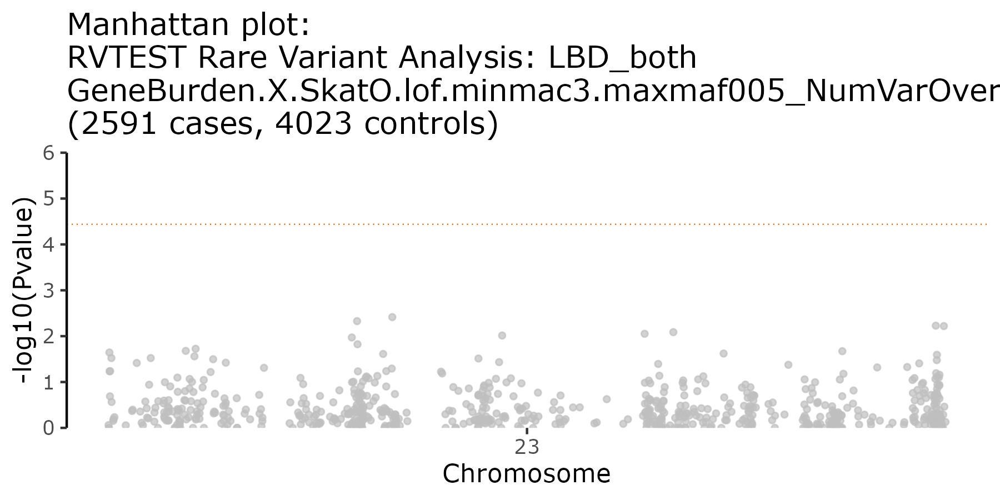

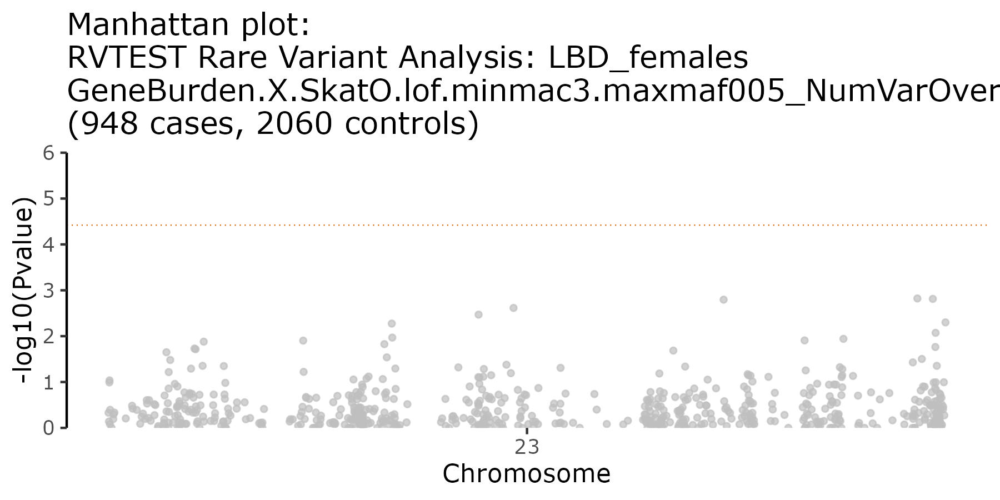

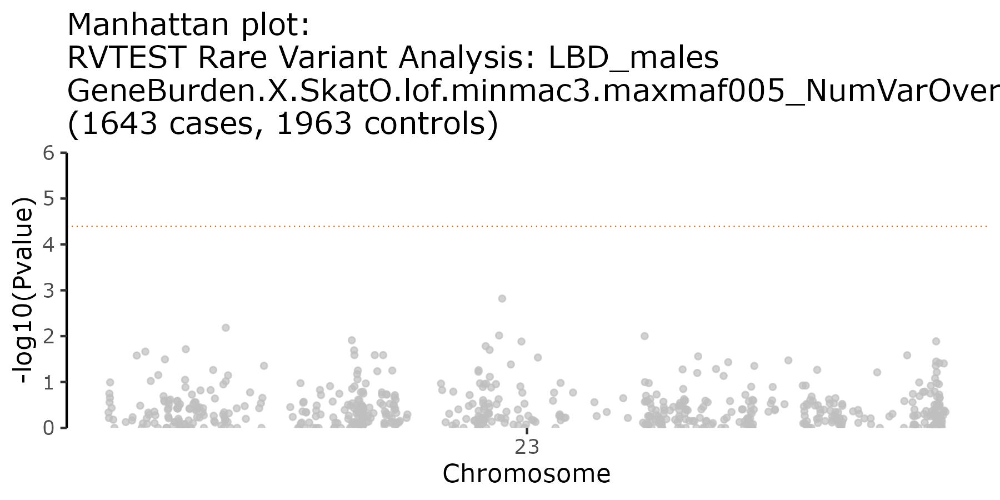

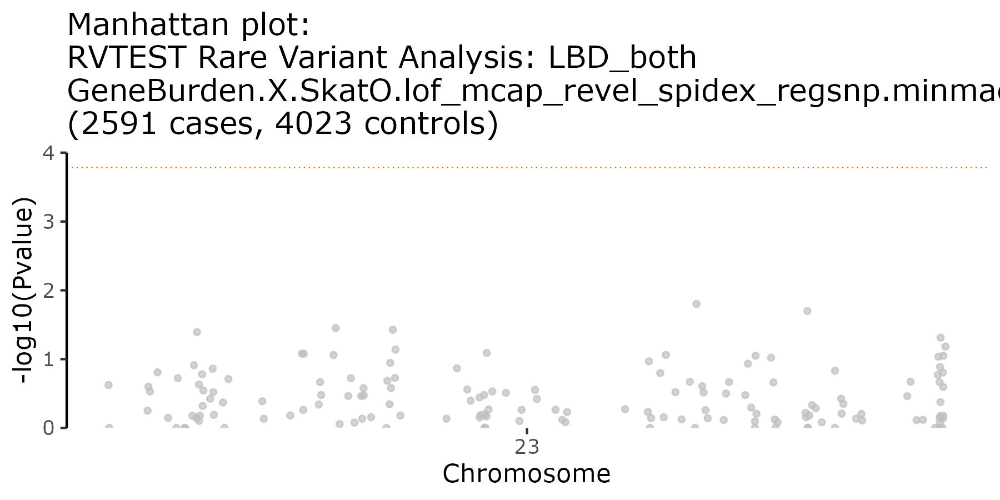

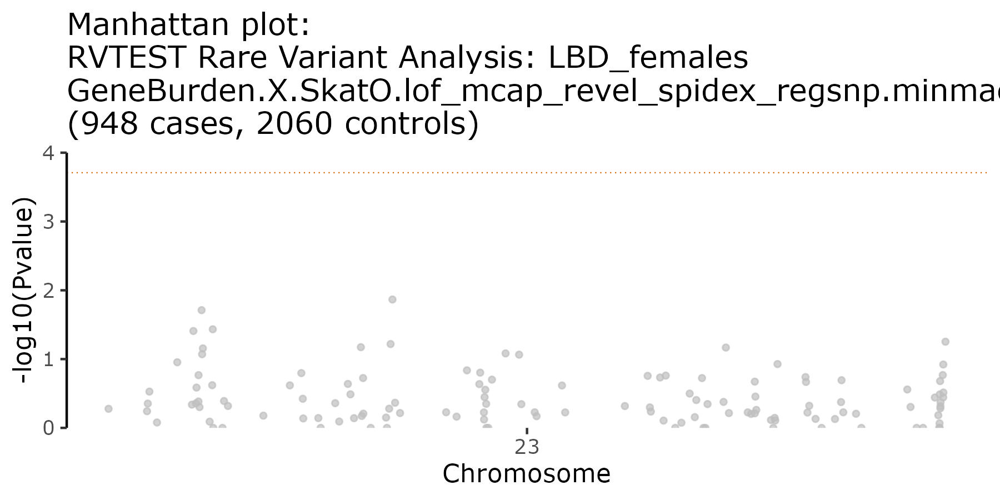

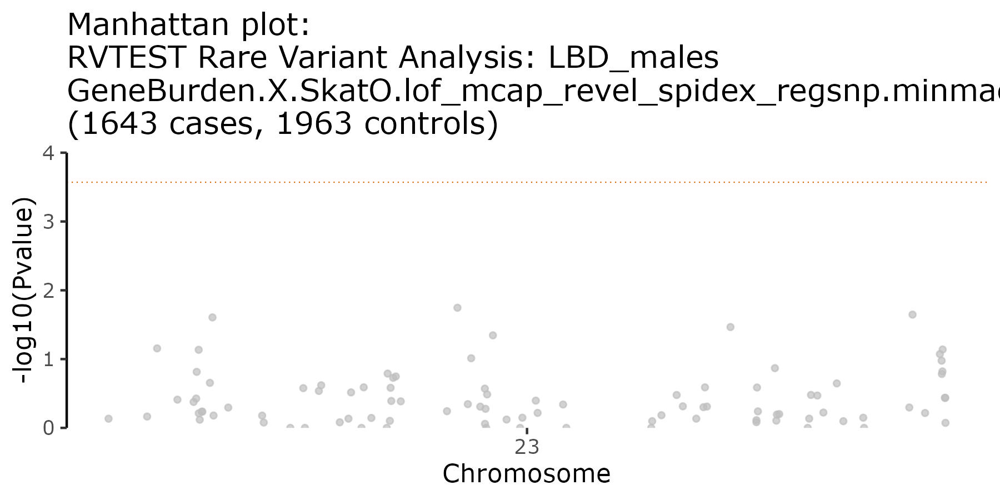

In [1]:
from IPython.display import display
from PIL import Image

func_group=['lof','lof_mcap_revel_spidex_regsnp']
test = "SkatO"

for i in func_group:
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_both.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_females.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_males.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))


#### MISSENSE

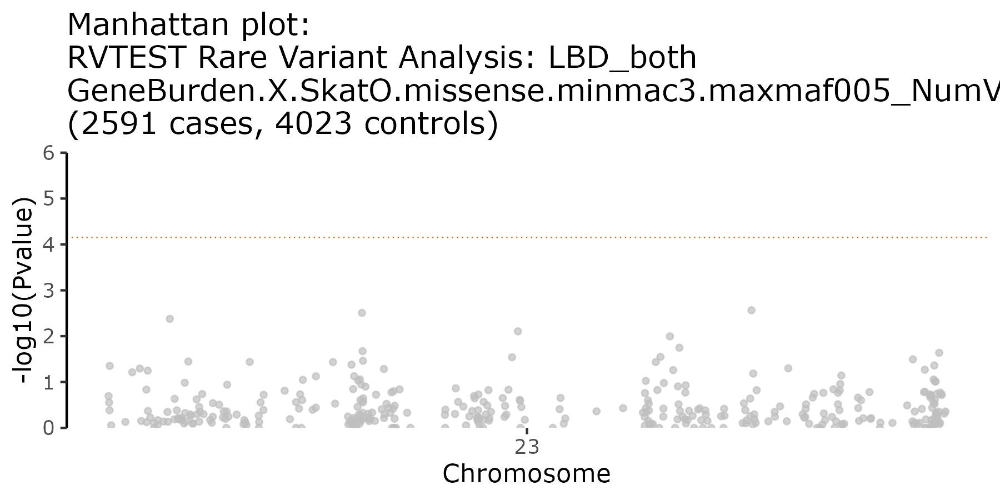

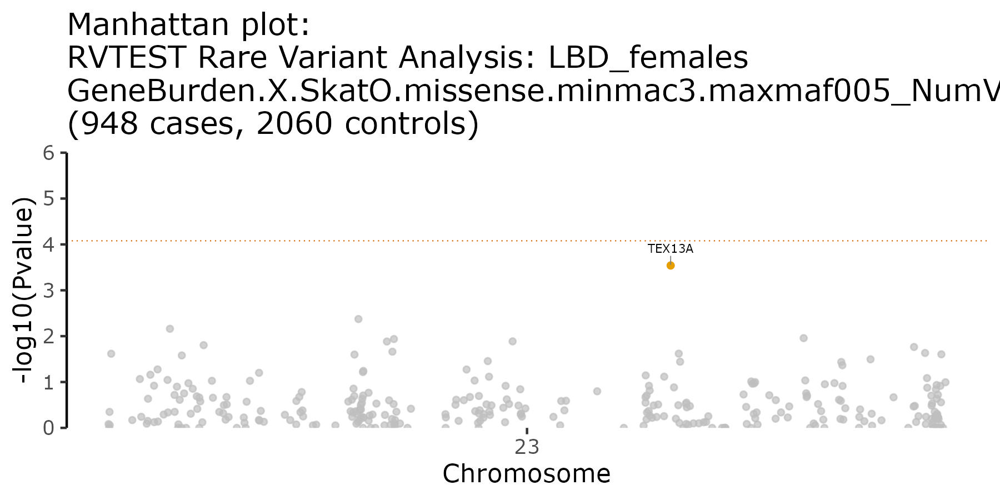

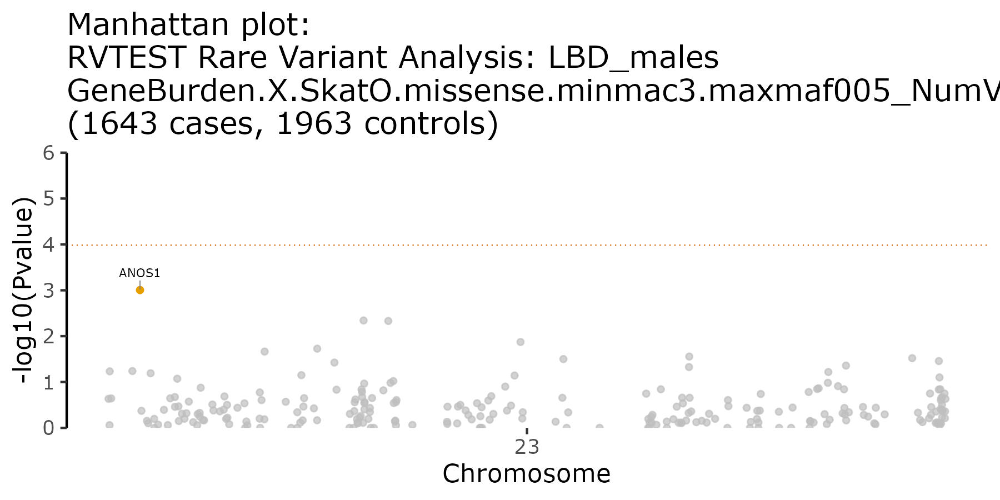

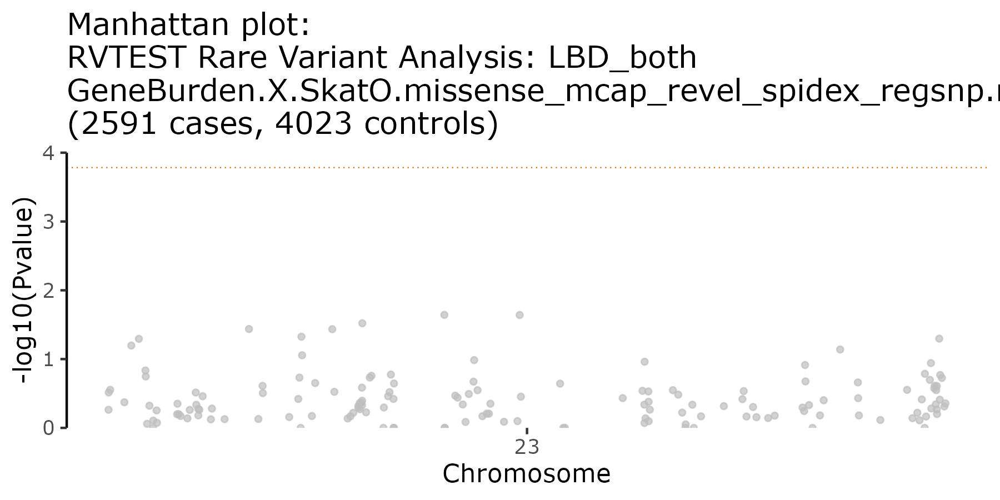

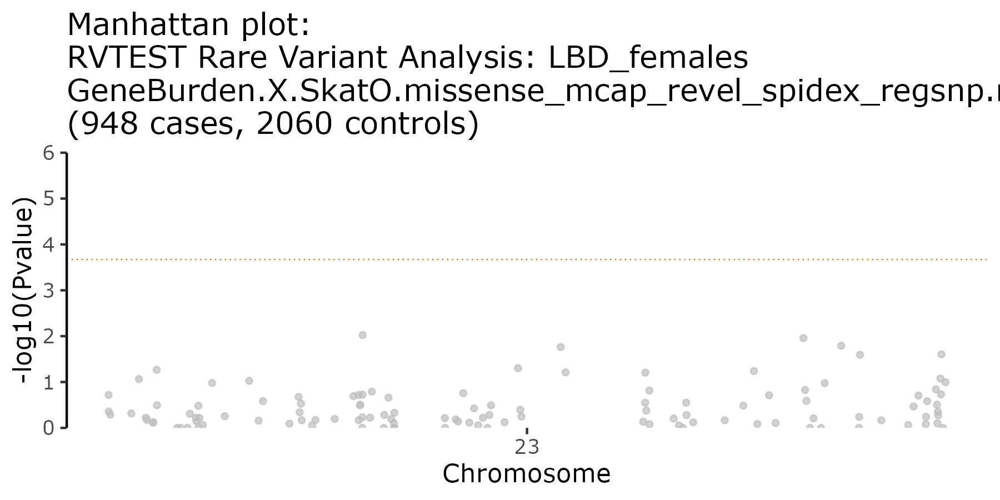

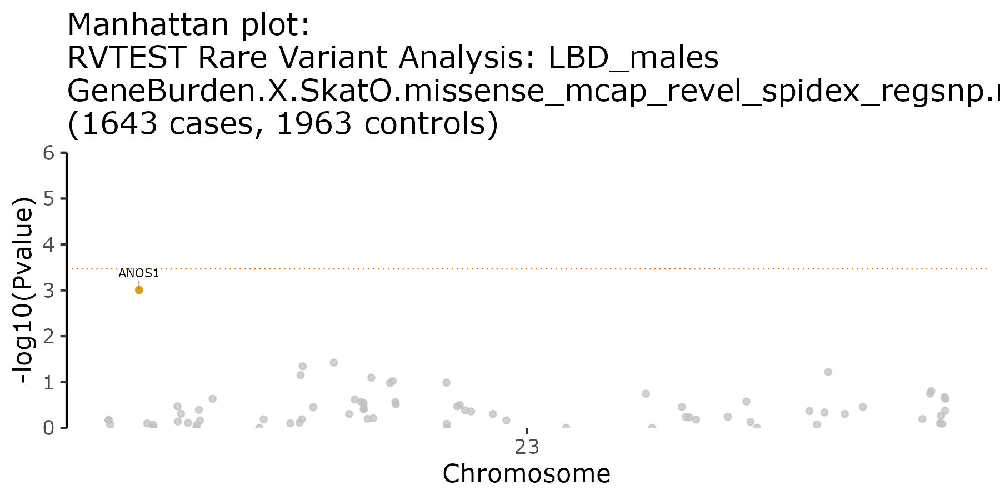

In [2]:
from IPython.display import display
from PIL import Image

func_group=['missense','missense_mcap_revel_spidex_regsnp']
test = "SkatO"

for i in func_group:
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_both.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_females.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_males.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))


##### Generate list of `missense` variants for TEX13A

In [22]:
%%bash
cd short_VCFs/

module load R/3.5.2
R --vanilla --no-save

require(data.table)
require(tidyverse)

# assign func_group name
func_name <- "missense"

# assign genes
genes <- c("TEX13A","ANOS1")

# read in annotation file
annot <- fread("annotation.tidy.X.hg38_multianno_TIDY_CLEAN.txt",header=T)

# read in functional grouping file containing list of variants
vars <- fread(paste(func_name,"_variant_names.txt",sep=""),header=F)
colnames(vars) <- "SNP"

# filter annotation file to keep variants that are present in the fucntional grouping file
annot_filter <- subset(annot, annot$SNP %in% vars$SNP)

# tabulate number of variants per gene; then filter to keep only genes where there are more than 1 variant
vars_per_gene <- annot_filter %>% group_by(Gene.refGene) %>% count() %>% filter(n>1)

# refilter the `annot_filter` dataframe to contain only genes of interest
annot_filter_clean <- subset(annot_filter, annot_filter$Gene.refGene %in% vars_per_gene$Gene.refGene)

gene_of_interest <- subset(annot_filter_clean, annot_filter_clean$Gene.refGene %in% genes)
gene_of_interest

# write out list of SNP; will use this to extract the actual glm results
write.table(gene_of_interest %>% select(SNP,Gene.refGene,Func.refGene,AAChange.refGene,GeneDetail.refGene), "../BURDEN_OUTPUT/missense/BURDEN_005MAF_females.X.SkatO.assoc_geneList_signif.txt", sep="\t", quote=F, row.names=F,col.names=T)

[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn2294 
[-] Unloading R 4.3.0 
Lmod has detected the following error: The following module(s) are unknown:
"R/3.5.2"

Please check the spelling or version number. Also try "module spider ..."
It is also possible your cache file is out-of-date; it may help to try:
  $ module --ignore_cache load "R/3.5.2"

Also make sure that all modulefiles written in TCL start with the string
#%Module






R version 4.3.0 (2023-04-21) -- "Already Tomorrow"
Copyright (C) 2023 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> 
> require(data.table)


Loading required package: data.table


> require(tidyverse)


Loading required package: tidyverse
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()     masks data.table::between()
✖ dplyr::filter()      masks stats::filter()
✖ dplyr::first()       masks data.table::first()
✖ lubridate::hour()    masks data.table::hour()
✖ lubridate::isoweek() masks data.table::isoweek()
✖ dplyr::lag()         masks stats::lag()
✖ dplyr::last()        masks data.table::last()
✖ lubridate::mday()    masks data.table::mday()
✖ lubridate::minute()  masks data.table::minute()
✖ lubridate::month()   masks data.table::month()
✖ lubridate::quarter() masks data.table::quarter()
✖ lubridate::second()  masks data.table::second()
✖ purrr::transpose()   masks data.tab

> 
> # assign func_group name
> func_name <- "missense"
> 
> # assign genes
> genes <- c("TEX13A","ANOS1")
> 
> # read in annotation file
> annot <- fread("annotation.tidy.X.hg38_multianno_TIDY_CLEAN.txt",header=T)
> 
> # read in functional grouping file containing list of variants
> vars <- fread(paste(func_name,"_variant_names.txt",sep=""),header=F)
> colnames(vars) <- "SNP"
> 
> # filter annotation file to keep variants that are present in the fucntional grouping file
> annot_filter <- subset(annot, annot$SNP %in% vars$SNP)
> 
> # tabulate number of variants per gene; then filter to keep only genes where there are more than 1 variant
> vars_per_gene <- annot_filter %>% group_by(Gene.refGene) %>% count() %>% filter(n>1)
> 
> # refilter the `annot_filter` dataframe to contain only genes of interest
> annot_filter_clean <- subset(annot_filter, annot_filter$Gene.refGene %in% vars_per_gene$Gene.refGene)
> 
> gene_of_interest <- subset(annot_filter_clean, annot_filter_clean$Gene.refGene %

#### MISSENSE_LOF

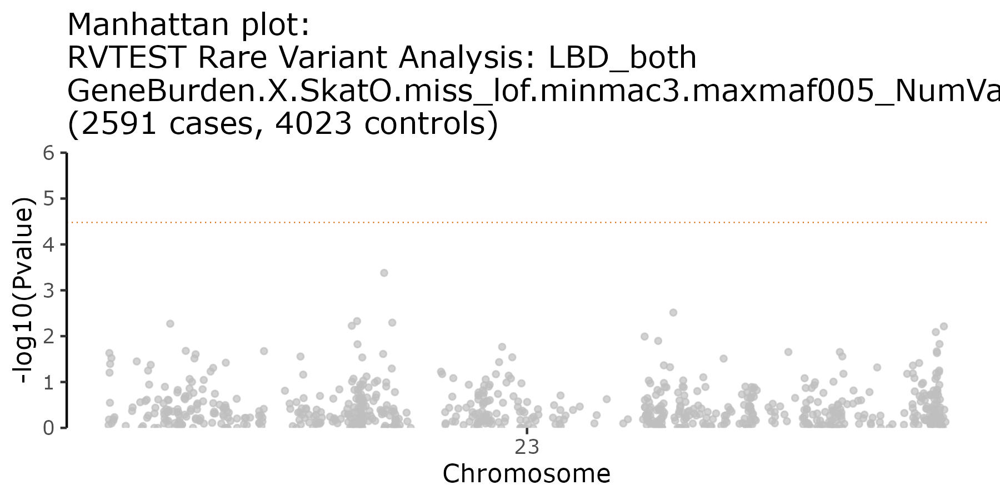

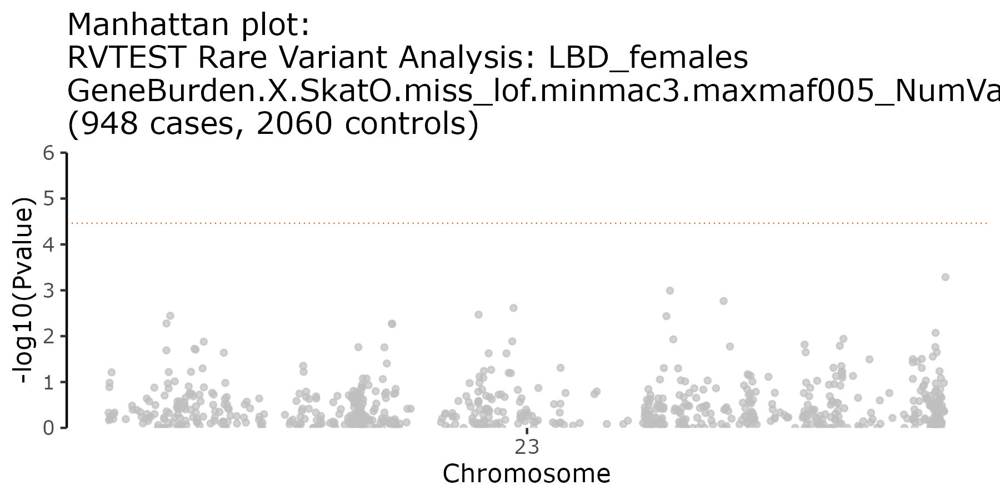

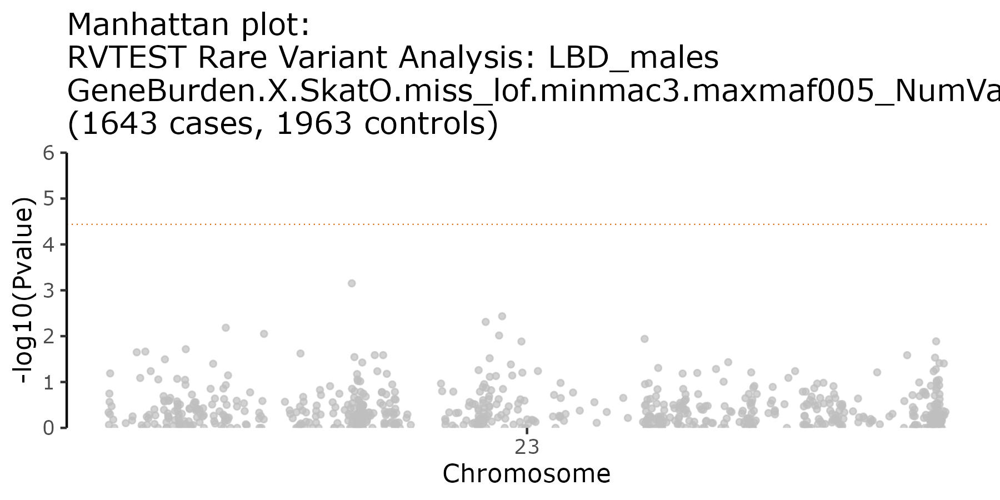

In [4]:
from IPython.display import display
from PIL import Image

func_group=['miss_lof']
test = "SkatO"

for i in func_group:
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_both.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_females.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_males.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))


#### CADD12

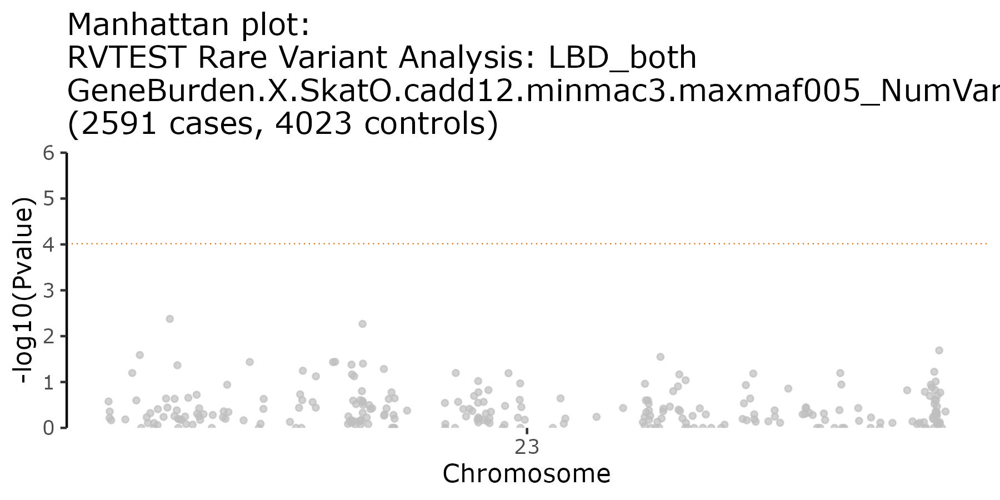

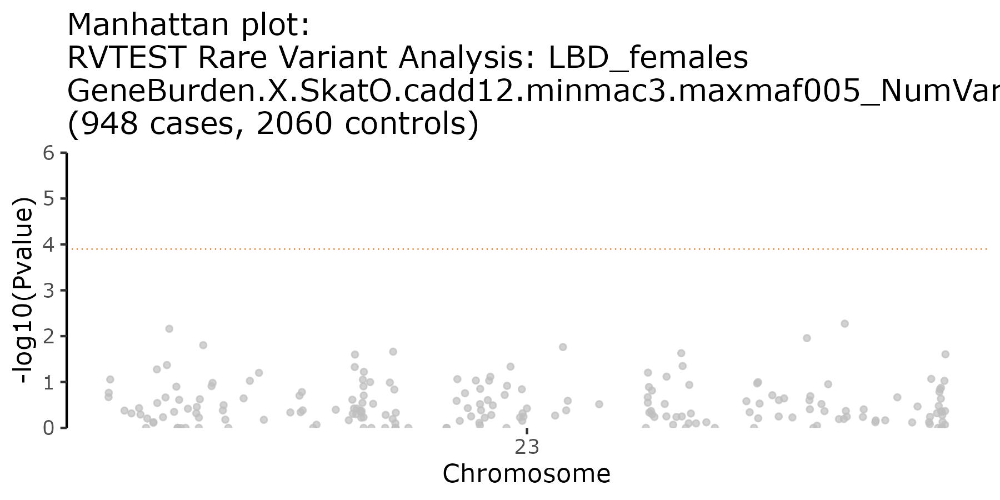

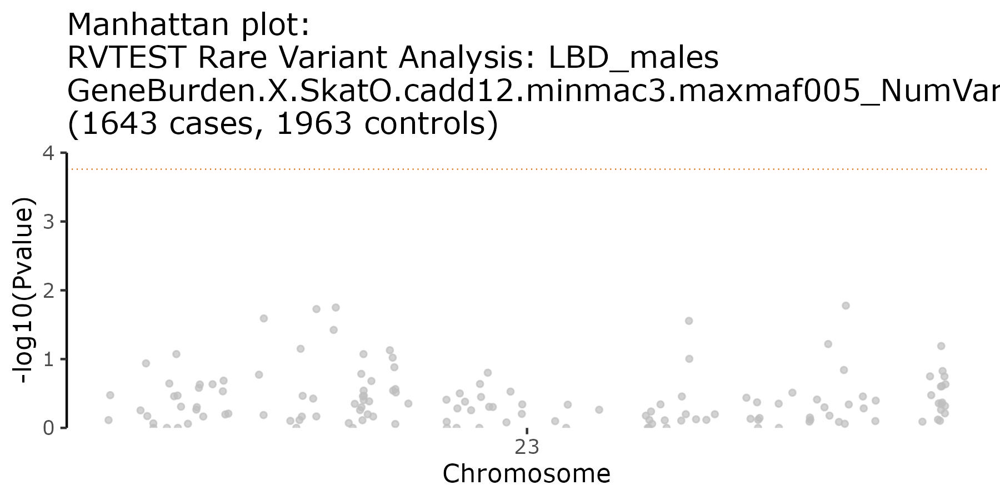

In [5]:
from IPython.display import display
from PIL import Image

func_group=['cadd12']
test = "SkatO"

for i in func_group:
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_both.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_females.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_males.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))


### SKAT

#### LOF

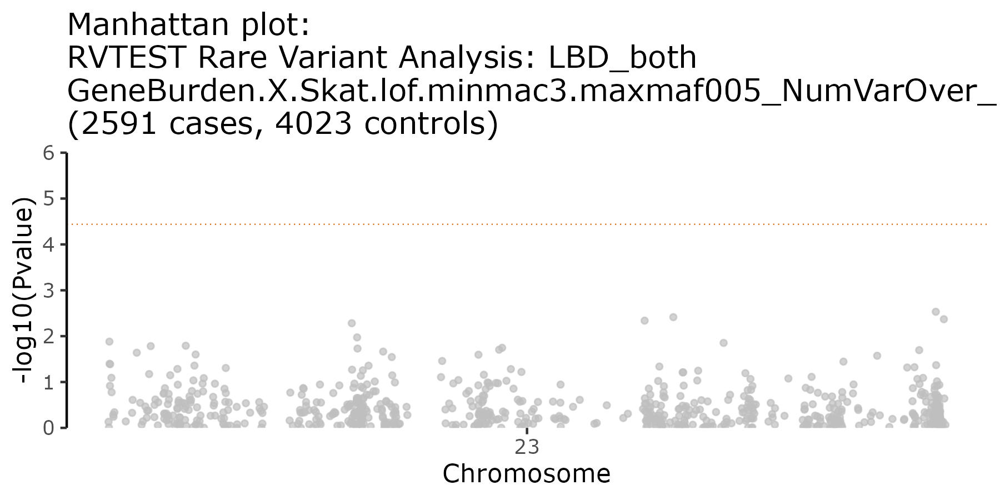

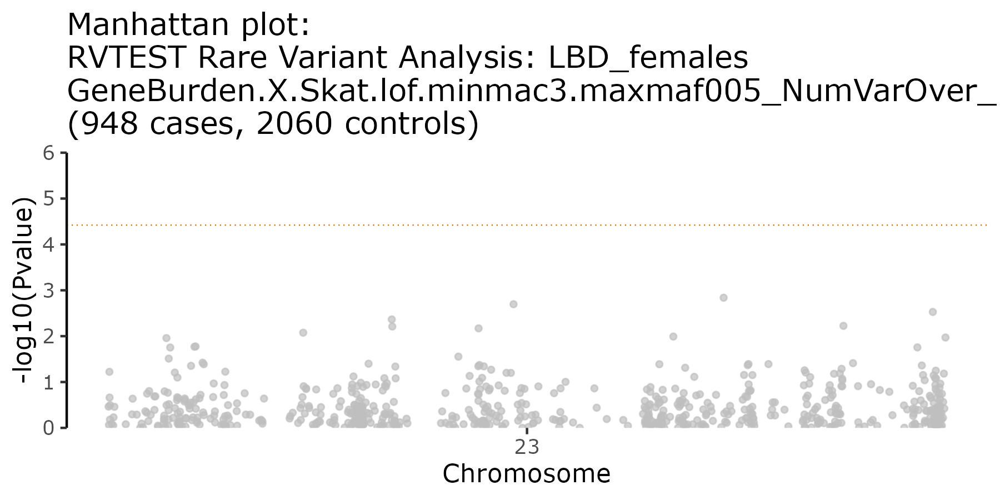

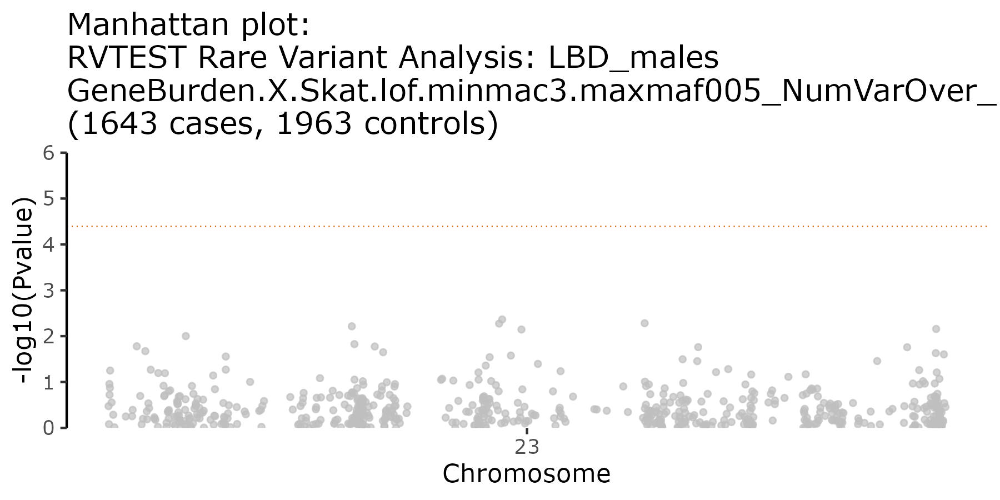

In [7]:
from IPython.display import display
from PIL import Image

func_group=['lof']
test = "Skat"

for i in func_group:
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_both.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_females.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_males.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))


#### MISSENSE

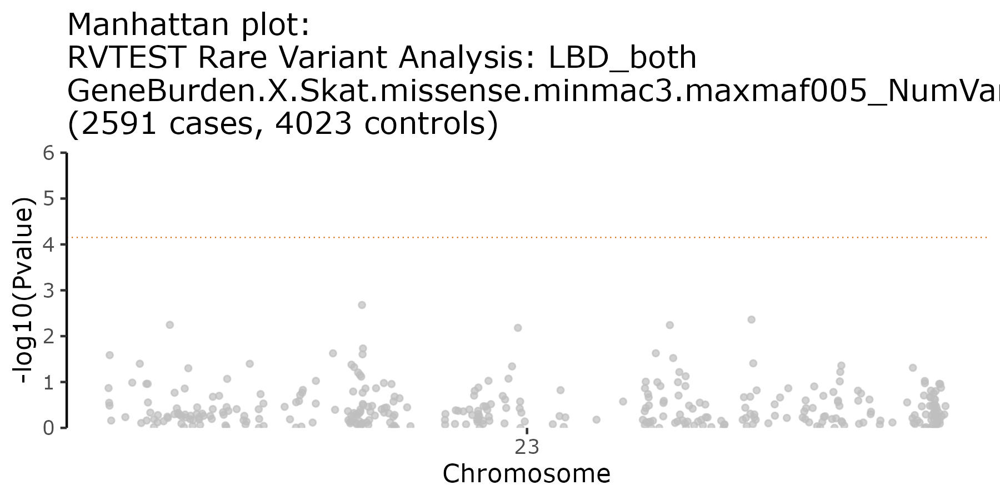

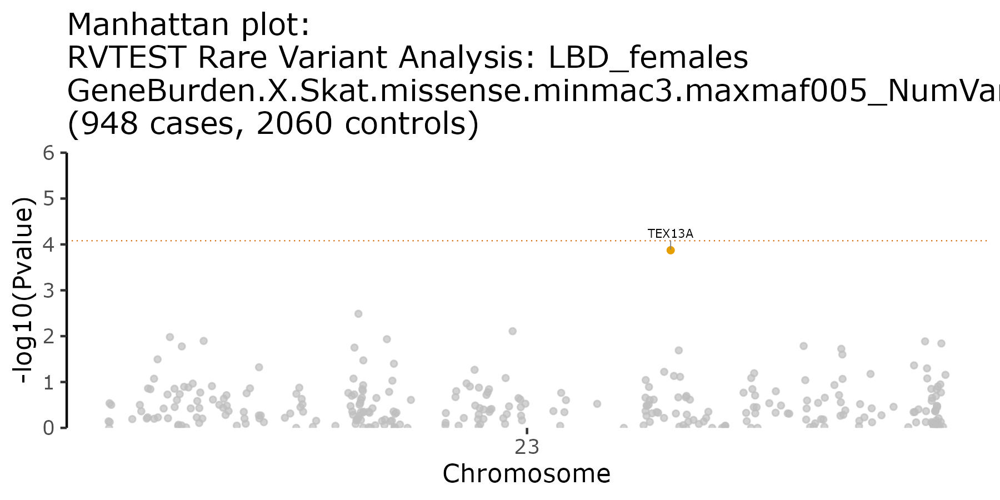

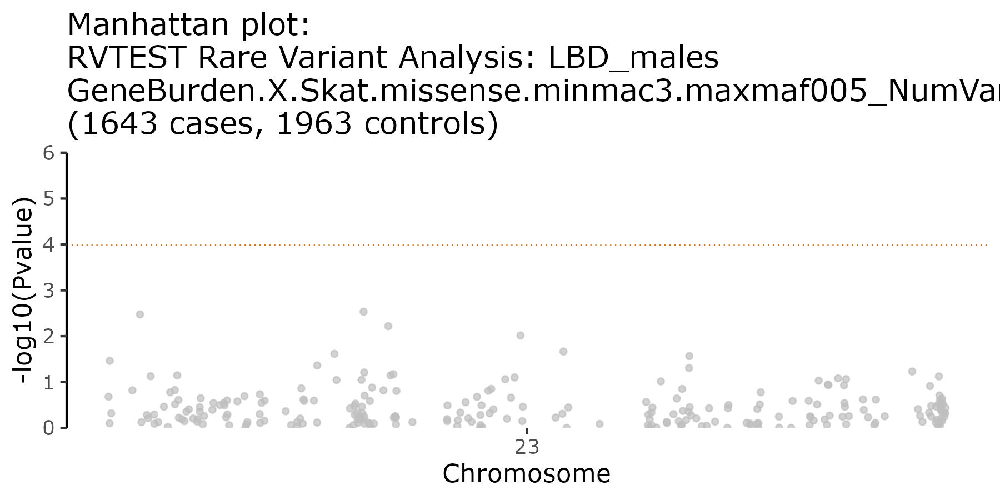

In [8]:
from IPython.display import display
from PIL import Image

func_group=['missense']
test = "Skat"

for i in func_group:
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_both.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_females.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_males.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))


##### Pull TEX13A

In [40]:
import pandas as pd
data = pd.read_csv("BURDEN_OUTPUT/missense/BURDEN_005MAF_females.X.Skat.assoc",sep="\t")
data[(data.Gene == "TEX13A")]


,Gene,RANGE,N_INFORMATIVE,NumVar,NumPolyVar,Q,Pvalue,NumPerm,ActualPerm,Stat,NumGreater,NumEqual,PermPvalue
243,TEX13A,"X:105218928-105220694,X:105218928-105220694",3008,4,4,94076.6,0.000134,10000,10000,94076.6,3,0,0.0003


In [41]:
import pandas as pd
data = pd.read_csv("BURDEN_OUTPUT/missense/BURDEN_005MAF_males.X.Skat.assoc",sep="\t")
data[(data.Gene == "TEX13A")]


,Gene,RANGE,N_INFORMATIVE,NumVar,NumPolyVar,Q,Pvalue,NumPerm,ActualPerm,Stat,NumGreater,NumEqual,PermPvalue
228,TEX13A,"X:105218928-105220694,X:105218928-105220694",3606,3,3,22856.8,0.501515,10000,1879,22856.8,1000,0,0.532198


In [42]:
import pandas as pd
data = pd.read_csv("BURDEN_OUTPUT/missense/BURDEN_005MAF_both.X.Skat.assoc",sep="\t")
data[(data.Gene == "TEX13A")]


,Gene,RANGE,N_INFORMATIVE,NumVar,NumPolyVar,Q,Pvalue,NumPerm,ActualPerm,Stat,NumGreater,NumEqual,PermPvalue
258,TEX13A,"X:105218928-105220694,X:105218928-105220694",6614,4,4,205035.0,0.005736,10000,10000,205035.0,52,0,0.0052


##### Generate list of `missense` variants for TEX13A

In [45]:
%%bash
cd short_VCFs/

module load R/3.5.2
R --vanilla --no-save

require(data.table)
require(tidyverse)

# assign func_group name
func_name <- "missense"

# assign genes
genes <- "TEX13A"

# read in annotation file
annot <- fread("annotation.tidy.X.hg38_multianno_TIDY_CLEAN.txt",header=T)

# read in functional grouping file containing list of variants
vars <- fread(paste(func_name,"_variant_names.txt",sep=""),header=F)
colnames(vars) <- "SNP"

# filter annotation file to keep variants that are present in the fucntional grouping file
annot_filter <- subset(annot, annot$SNP %in% vars$SNP)

# tabulate number of variants per gene; then filter to keep only genes where there are more than 1 variant
vars_per_gene <- annot_filter %>% group_by(Gene.refGene) %>% count() %>% filter(n>1)

# refilter the `annot_filter` dataframe to contain only genes of interest
annot_filter_clean <- subset(annot_filter, annot_filter$Gene.refGene %in% vars_per_gene$Gene.refGene)

gene_of_interest <- subset(annot_filter_clean, annot_filter_clean$Gene.refGene %in% genes)
gene_of_interest

# write out list of SNP; will use this to extract the actual glm results
write.table(gene_of_interest %>% select(SNP,Gene.refGene,Func.refGene,AAChange.refGene,GeneDetail.refGene), "../BURDEN_OUTPUT/missense/BURDEN_005MAF_females.X.Skat.assoc_geneList_signif.txt", sep="\t", quote=F, row.names=F,col.names=T)

[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn2294 
[-] Unloading R 4.3.0 
Lmod has detected the following error: The following module(s) are unknown:
"R/3.5.2"

Please check the spelling or version number. Also try "module spider ..."
It is also possible your cache file is out-of-date; it may help to try:
  $ module --ignore_cache load "R/3.5.2"

Also make sure that all modulefiles written in TCL start with the string
#%Module






R version 4.3.0 (2023-04-21) -- "Already Tomorrow"
Copyright (C) 2023 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> 
> require(data.table)


Loading required package: data.table


> require(tidyverse)


Loading required package: tidyverse
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()     masks data.table::between()
✖ dplyr::filter()      masks stats::filter()
✖ dplyr::first()       masks data.table::first()
✖ lubridate::hour()    masks data.table::hour()
✖ lubridate::isoweek() masks data.table::isoweek()
✖ dplyr::lag()         masks stats::lag()
✖ dplyr::last()        masks data.table::last()
✖ lubridate::mday()    masks data.table::mday()
✖ lubridate::minute()  masks data.table::minute()
✖ lubridate::month()   masks data.table::month()
✖ lubridate::quarter() masks data.table::quarter()
✖ lubridate::second()  masks data.table::second()
✖ purrr::transpose()   masks data.tab

> 
> # assign func_group name
> func_name <- "missense"
> 
> # assign genes
> genes <- "TEX13A"
> 
> # read in annotation file
> annot <- fread("annotation.tidy.X.hg38_multianno_TIDY_CLEAN.txt",header=T)
> 
> # read in functional grouping file containing list of variants
> vars <- fread(paste(func_name,"_variant_names.txt",sep=""),header=F)
> colnames(vars) <- "SNP"
> 
> # filter annotation file to keep variants that are present in the fucntional grouping file
> annot_filter <- subset(annot, annot$SNP %in% vars$SNP)
> 
> # tabulate number of variants per gene; then filter to keep only genes where there are more than 1 variant
> vars_per_gene <- annot_filter %>% group_by(Gene.refGene) %>% count() %>% filter(n>1)
> 
> # refilter the `annot_filter` dataframe to contain only genes of interest
> annot_filter_clean <- subset(annot_filter, annot_filter$Gene.refGene %in% vars_per_gene$Gene.refGene)
> 
> gene_of_interest <- subset(annot_filter_clean, annot_filter_clean$Gene.refGene %in% genes)


In [9]:
!grep -Ew "ID|chrX:105219038:T:C|chrX:105219161:A:G|chrX:105219658:T:A|chrX:105219976:T:C" /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/females_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.females.hg38.chrX.tab > RareVariants_GLM_TEX13A.txt

In [10]:
import pandas as pd
vars = pd.read_csv("RareVariants_GLM_TEX13A.txt",sep="\t")
vars

,CHROM,POS,ID,marker,EffectAllele,OtherAllele,OR,BETA,SE,P,Freq_EffectAllele,Freq_EffectAllele.CASE,Freq_EffectAllele.CTRL,ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,EffectAllele_CT,EffectAllele_CT.CASE,EffectAllele_CT.CTRL
0,X,105219038,chrX:105219038:T:C,X:105219038:T:C,C,T,1.076850,0.074040,1.238840,0.952344,0.000499,0.000527,0.000485,6016,1896,4120,3,1,2
1,X,105219161,chrX:105219161:A:G,X:105219161:A:G,G,A,0.570345,-0.561514,1.174280,0.632524,0.000665,0.000527,0.000728,6016,1896,4120,4,1,3
2,X,105219658,chrX:105219658:T:A,X:105219658:T:A,A,T,1.990060,0.688165,0.227282,0.002463,0.014295,0.021097,0.011165,6016,1896,4120,86,40,46
3,X,105219976,chrX:105219976:T:C,X:105219976:T:C,C,T,0.387679,-0.947578,0.334423,0.004604,0.011968,0.005802,0.014806,6016,1896,4120,72,11,61


#### MISSENSE_LOF

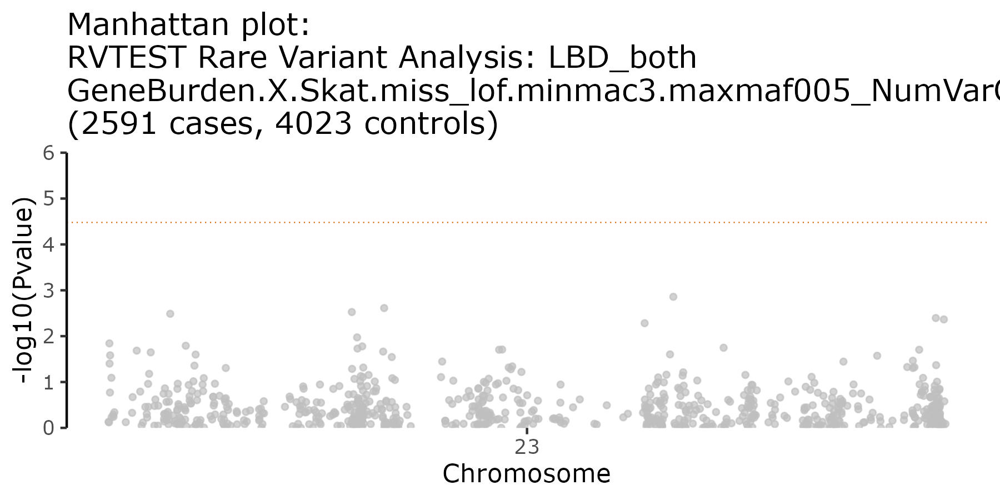

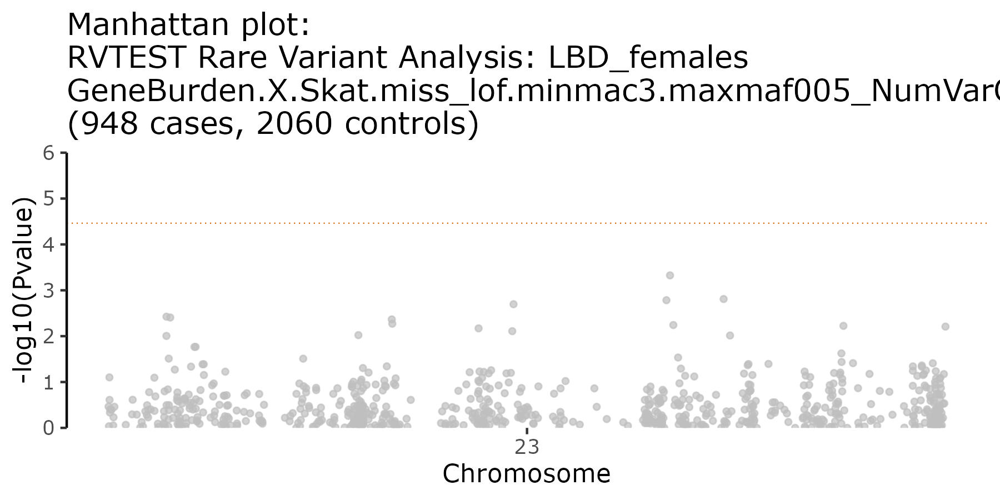

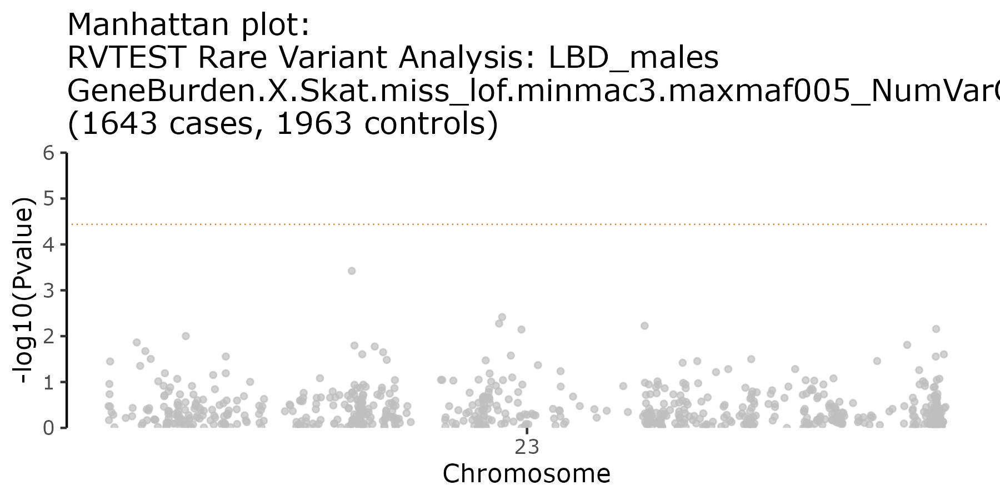

In [11]:
from IPython.display import display
from PIL import Image

func_group=['miss_lof']
test = "Skat"

for i in func_group:
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_both.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_females.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_males.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))


#### CADD12

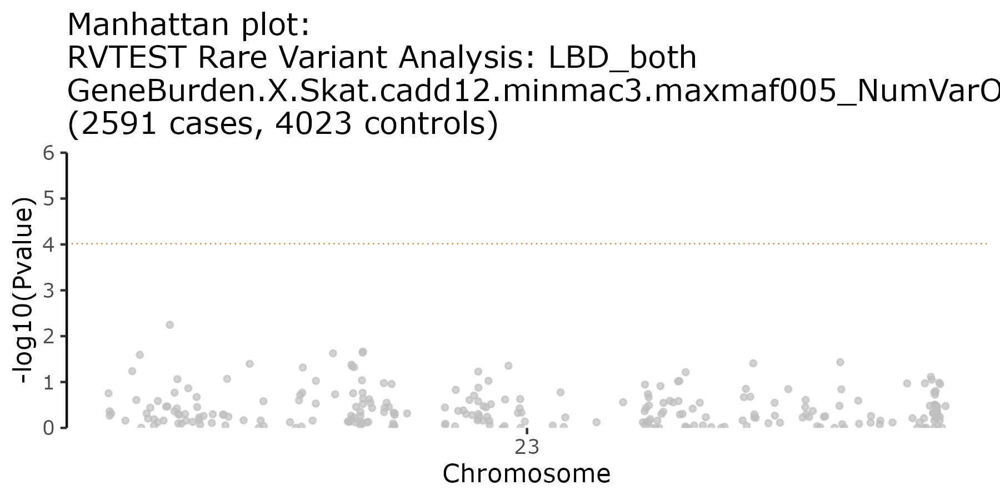

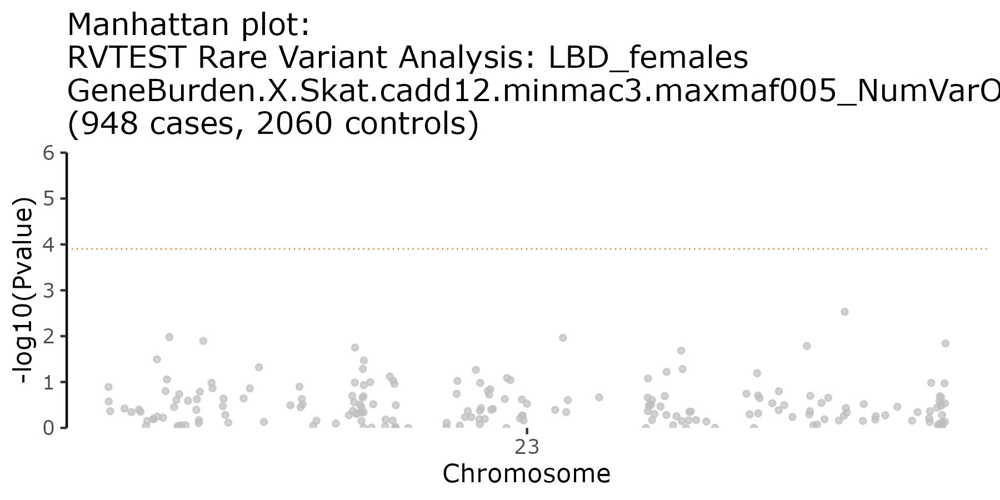

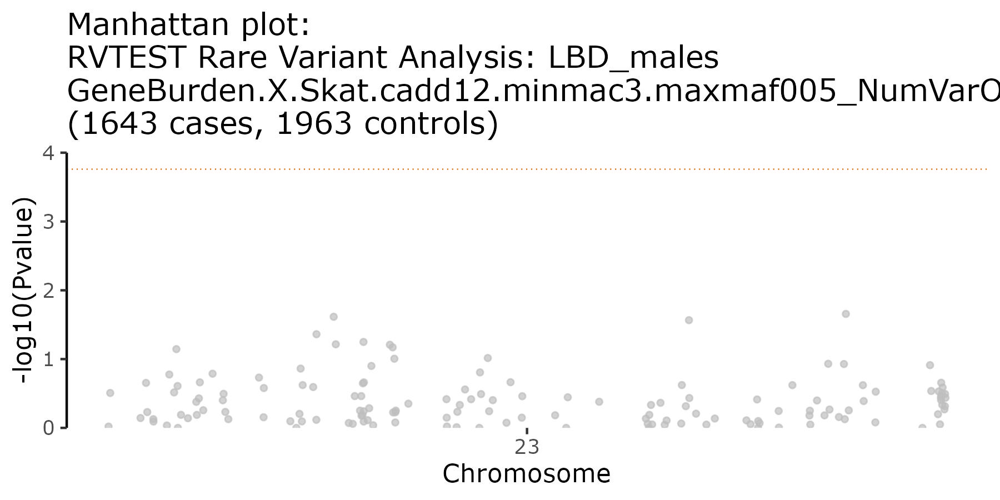

In [12]:
from IPython.display import display
from PIL import Image

func_group=['cadd12']
test = "Skat"

for i in func_group:
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_both.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_females.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
    display(Image.open("BURDEN_OUTPUT/" + i + "/LBD_males.GeneBurden.X." + test + "." + i + ".minmac3.maxmaf005_NumVarOver_1.manhattan_v1.jpeg"))
